In [1]:
import pandas as pd
ALL_data = pd.read_csv("./Data/ALL_NP_DATA.csv",index_col=0)
ALL_RPA = pd.read_csv("./Data/PROTEIN_RPA.csv",index_col=0)
Protein_Feature = pd.read_csv("./Data/ALL_PROTEIN_FEATURE.csv",index_col=0)

In [2]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.model_selection import KFold,RandomizedSearchCV,GridSearchCV,train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from math import sqrt
from tqdm import tqdm
import numpy as np
from sklearn import svm
from mlxtend.regressor import StackingCVRegressor,LinearRegression,StackingRegressor
from sklearn.ensemble import ExtraTreesRegressor,RandomForestRegressor,GradientBoostingRegressor,BaggingRegressor,HistGradientBoostingRegressor,RandomForestClassifier,ExtraTreesClassifier,GradientBoostingClassifier,HistGradientBoostingClassifier,VotingRegressor
from xgboost import XGBRegressor,XGBClassifier
from lightgbm import LGBMRegressor,LGBMClassifier
# from torch import nn
#from skorch import NeuralNetRegressor
import joblib
import torch
import torch.nn as nn
import os
from sklearn import metrics
from warnings import filterwarnings

In [40]:
?GradientBoostingRegressor

In [3]:
mask = (ALL_RPA>0)
RPA = pd.DataFrame(mask,dtype=int)

In [4]:
ALL_data = pd.read_csv("./Data/ALL_NP_DATA.csv",index_col=0)
del ALL_data["Title"]
colums_name = ALL_data.columns
R_VS_P = pd.read_csv("R_VS_P.csv",index_col=0)
OS = R_VS_P[R_VS_P["OS_F-ERT_F"]>0]
ERT = R_VS_P[R_VS_P["OS_F-ERT_F"]<=0]

In [6]:
# p_dataframe = pd.DataFrame(columns=["T/sum"])
protein_id = RPA.columns
for p_id in tqdm(protein_id):
    ALL_Y = ALL_RPA[p_id]
    ALL_Y = ALL_Y[mask[p_id]]
    ALL_X = ALL_data[mask[p_id]]
    # ALL_Y = RPA[p_id]
    # scaler = MinMaxScaler()
    # scaler.fit(ALL_X)
    # ALL_X = scaler.transform(ALL_X)
    # ALL_X = pd.DataFrame(ALL_X)

    Train_X,Test_X,Train_y,Test_y = train_test_split(ALL_X,ALL_Y,test_size=0.2,random_state=1412)
    Train_ = pd.concat([Train_X,Train_y],axis=1)
    Test_ = pd.concat([Test_X,Test_y],axis=1)
    Train_.to_csv("./Protein_data/" + p_id + "_Regressor_Train_data.csv")
    Test_.to_csv("./Protein_data/" + p_id + "_Regressor_Test_data.csv")
    # Train_ = pd.read_csv("./Protein_Data/" + p_id + "_Train_data.csv")
    # percent =  Train_[p_id].sum() / len(Train_)
    # p_dataframe.loc[p_id] = [percent]
    # Test_ = pd.read_csv("./Protein_Data/" + p_id + "_Test_data.csv")

100%|██████████| 178/178 [00:01<00:00, 150.51it/s]


In [8]:
from warnings import filterwarnings
filterwarnings("ignore")
protein_id = ALL_RPA.columns
# metrics_test_regressor = pd.DataFrame(columns=["rmse","r2"])
metrics_RF_test = pd.DataFrame(columns=["rmse","r2"])
# metrics_ERT_test = pd.DataFrame(columns=["AUROC","Recall","Precision","F1","MCC","ACC"])
metrics_GBDT_test = pd.DataFrame(columns=["rmse","r2"])
# metrics_LGBM_test = pd.DataFrame(columns=["rmse","r2"])
# metrics_XGB_test = pd.DataFrame(columns=["rmse","r2"])
for p_id in tqdm(protein_id):
    train_data = pd.read_csv("./Protein_data/" + p_id + "_Regressor_Train_data.csv",index_col=0)
    test_data = pd.read_csv("./Protein_data/" + p_id + "_Regressor_Test_data.csv",index_col=0)
    del train_data["Title"]
    del test_data["Title"]
    Train_X = train_data.iloc[:,:-1]
    Train_y = train_data.iloc[:,-1]
    Test_X = test_data.iloc[:,:-1]
    Test_y = test_data.iloc[:,-1]
    Train_y.index = [i for i in range(len(Train_y))]
    Test_y.index = [i for i in range(len(Test_y))]
    Train_y = pd.DataFrame(Train_y)
    Test_y = pd.DataFrame(Test_y)
    scaler = MinMaxScaler()
    scaler.fit(Train_X)
    Train_X = scaler.transform(Train_X)
    Train_X = pd.DataFrame(Train_X)
    Test_X = scaler.transform(Test_X)
    Test_X = pd.DataFrame(Test_X)
    # RF_ = RandomForestRegressor(random_state=1412)
    # ERT_ = ExtraTreesRegressor(random_state=1412)
    # GBDT_ = GradientBoostingRegressor(random_state=1412)

    model_ERT = joblib.load("./ERT_Regressor_Model/" + p_id + "_ERT_best.pkl")
    # model_GBDT = joblib.load("./GBDT_Regressor_Model/" + p_id + "_GBDT_best.pkl")
    model_RF = joblib.load("./RF_Regressor_Model/" + p_id + "_RF_best.pkl")
    #
    param_rf = {    "n_estimators":[*range(50,2000,25)],
                  "max_depth":[*range(1,25,2)],
                     "max_features": [1,"log2","sqrt",16,32,64,"auto"],
                     "min_impurity_decrease": [*np.arange(0,5,10)],
    }
    param_stacking_rf = {"meta_regressor__n_estimators":[*range(50,2000,25)],
                  "meta_regressor__max_depth":[*range(1,25,2)],
                     "meta_regressor__max_features": [1,"log2","sqrt",16,32,64],
                     "meta_regressor__min_impurity_decrease": [*np.arange(0,5,10)]}
    # param_stacking_ert = {"meta_regressor__n_estimators":[*range(50,2000,25)],
    #               "meta_regressor__max_depth":[*range(1,25,2)],
    #                  "meta_regressor__max_features": [1,"log2","sqrt",16,32,64],
    #                  "meta_regressor__min_samples_split": [*range(2,13,1)],
    #                 "meta_regressor__bootstrap": [True,False]}
    # param_rf = {    "n_estimators":[*range(cla_model_rf.n_estimators-50,cla_model_rf.n_estimators+50,1)],
    #                  "max_depth":[*range(1,cla_model_rf.max_depth*2,1)],
    #                  "max_features": [*range(1,cla_model_rf.max_features*2,1)] if type(cla_model_rf.max_features) != str else [cla_model_rf.max_features],
    #                  # "min_impurity_decrease": [np.arange(0,cla_model_rf.min_impurity_decrease*2,10) if cla_model_rf.min_impurity_decrease != 0 else 0],
    # }
    # param_ert = {
    #             "n_estimators":[*range(50,2000,25)],
    #              'min_samples_split':[*range(2,13,1)],
    #              "max_features":[1,"log2","sqrt","auto",16,32,64],
    #              'max_depth':range(1,25,2),
    #              "bootstrap":[True,False],
    #          # 'gamma':[i/100.0 for i in range(0,100)],
    #          # 'min_child_weight':range(2,7,2),
    #          }
    # param_ert = {
    #              "n_estimators":[*range(cla_model_ert.n_estimators-50,cla_model_ert.n_estimators+50,1)],
    #              'min_samples_split':[*range(2,cla_model_ert.min_samples_split*2,1)],
    #              "max_features":[*range(1,cla_model_ert.max_features*2,1)] if type(cla_model_ert.max_features) != str else [cla_model_ert.max_features],
    #              'max_depth':range(1,cla_model_ert.max_depth*2,2),
    # #              "bootstrap":[True,False],
    # #          'gamma':[i/100.0 for i in range(0,100)],
    # #          'min_child_weight':range(2,cla_model_ert.min_child_weight*2,1),
    # }
    # para_GBC = {
    #      'subsample':[i/10.0 for i in range(1,10)],
    #        'max_depth':[*range(1,cla_model_gbdt.max_depth*2,1)],
    #         "n_estimators":[*range(cla_model_gbdt.n_estimators-50,cla_model_gbdt.n_estimators+50,1)],
    #        'learning_rate':[*np.arange(0.0001,cla_model_gbdt.learning_rate*2,0.0001)],
    #         "max_features":[*range(1,cla_model_gbdt.max_features*2,1)] if type(cla_model_gbdt.max_features) != str else [cla_model_gbdt.max_features],
    # }
    para_GBC = {
           'subsample':[i/10.0 for i in range(1,10)],
           'max_depth':range(1,25,2),
           "n_estimators":[*range(50,2000,25)],
           'learning_rate':[0.001, 0.005, 0.01, 0.05,0.1,0.0001,0.0005],
           "max_features":[1,"log2","sqrt","auto",16,32,64],
    }
    # param_stacking_gbdt = {
    #         'meta_regressor__subsample':[i/10.0 for i in range(1,10)],
    #        'meta_regressor__max_depth':range(1,25,2),
    #        "meta_regressor__n_estimators":[*range(50,2000,25)],
    #        'meta_regressor__learning_rate':[0.001, 0.005, 0.01, 0.05,0.1,0.0001,0.0005],
    #        "meta_regressor__max_features":[1,"log2","sqrt",16,32,64]
    # }
    # param_voting = {
    #     # "rf__n_estimators":[*range(50,1000,25)],
    #     # "rf__max_depth":[*range(3,25,2)],
    #     # "rf__max_features": [1,"log2","sqrt",16,32,64],
    #     # "rf__min_impurity_decrease": [*np.arange(0,5,10)],
    #     # "ert__n_estimators":[*range(50,1000,25)],
    #     # "ert__max_depth":[*range(1,25,2)],
    #     # "ert__max_features": [1,"log2","sqrt",16,32,64],
    #     # "ert__min_samples_split": [*range(2,13,1)],
    #     # "ert__bootstrap": [True,False],
    #     # 'gbdt__subsample':[i/10.0 for i in range(1,10)],
    #     # 'gbdt__max_depth':range(1,25,2),
    #     # "gbdt__n_estimators":[*range(50,1000,25)],
    #     # 'gbdt__learning_rate':[0.001, 0.005, 0.01, 0.05,0.1,0.0001,0.0005],
    #     # "gbdt__max_features":[1,"log2","sqrt",16,32,64]
    #     "weights":[[i,j,k] for i in np.arange(0.1,1,0.1) for j in np.arange(0.1,1,0.1) for k in np.arange(0.1,1,0.1) ]
    # }
    # param_stacking_lr = {
    #     "meta_regressor__eta":[*np.arange(0.001,1,0.001)],
    #     "meta_regressor__epochs":[*range(50,150,10)]
    # }

    est = RandomForestRegressor(random_state=1412)
    cv = KFold(n_splits=10,shuffle = True,random_state=1412)
    searchest = RandomizedSearchCV(estimator=est
                            ,param_distributions=param_rf
                            ,cv = cv
                            ,scoring="neg_mean_squared_error"
                            ,random_state=1412
                            ,n_jobs=-1
                           )
    searchest.fit(Train_X,Train_y)
    model_ = searchest.best_estimator_
    model_.fit(Train_X,Train_y)
    # reg_model_rf = searchest.best_estimator_
    # reg_model_rf.fit(Train_X,Train_y)
    joblib.dump(model_,"./RF_Regressor_Model/" + p_id + "_RF_best.pkl")
    # joblib.dump(reg_model_rf,"./Model/Regressor_GBDT_without_cla/" + p_id + "_GBDT_best.pkl" )
    test_pred = model_.predict(Test_X)
    rmse = sqrt(mean_squared_error(Test_y,test_pred))
    # valid_rmse = valid_rmse + rmse
    r2 = r2_score(Test_y,test_pred)
    metrics_RF_test.loc[p_id] = [rmse,r2]

    est = GradientBoostingRegressor(random_state=1412)
    cv = KFold(n_splits=10,shuffle = True,random_state=1412)
    searchest = RandomizedSearchCV(estimator=est
                            ,param_distributions=para_GBC
                            ,cv = cv
                            ,scoring="neg_mean_squared_error"
                            ,random_state=1412
                            ,n_jobs=-1
                           )
    searchest.fit(Train_X,Train_y)
    model_ = searchest.best_estimator_
    model_.fit(Train_X,Train_y)
    # reg_model_rf = searchest.best_estimator_
    # reg_model_rf.fit(Train_X,Train_y)
    joblib.dump(model_,"./GBDT_Regressor_Model/" + p_id + "_GBDT_best.pkl")
    # joblib.dump(reg_model_rf,"./Model/Regressor_GBDT_without_cla/" + p_id + "_GBDT_best.pkl" )
    test_pred = model_.predict(Test_X)
    rmse = sqrt(mean_squared_error(Test_y,test_pred))
    # valid_rmse = valid_rmse + rmse
    r2 = r2_score(Test_y,test_pred)
    metrics_GBDT_test.loc[p_id] = [rmse,r2]

metrics_RF_test.to_csv("./Regressor_Model_results/RF_Regressor_test_results.csv")
metrics_GBDT_test.to_csv("./Regressor_Model_results/GBDT_Regressor_test_results.csv")

100%|██████████| 178/178 [13:49<00:00,  4.66s/it]


In [5]:
ERT_results = pd.read_csv("./Regressor_Model_results/ERT_Regressor_test_results.csv",index_col=0)
RF_results = pd.read_csv("./Regressor_Model_results/RF_Regressor_test_results.csv",index_col=0)
GBDT_results = pd.read_csv("./Regressor_Model_results/GBDT_Regressor_test_results.csv",index_col=0)

In [6]:
concat_r2 = pd.concat([ERT_results["r2"],RF_results["r2"],GBDT_results["r2"]],axis=1)
concat_r2.columns = ["ERT","RF","GBDT"]

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
resid = np.arange(0,178)


abbrev_col = concat_r2.index
systems = np.arange(10)
df = concat_r2.T


fig_dims= (178,50)

font  = {'family' : 'Arial',
        'weight' : 'bold',
        'size'   : 22}

#plt.rcParams['font.size'] = 10
#plt.rcParams["font.weight"] = "bold"
#plt.rcParams["axes.labelweight"] = "bold"
fig, ax = plt.subplots(figsize = fig_dims)

#Plot
colors =["tab:blue", "tab:orange", "tab:green","tab:red","tab:purple", "tab:brown", "tab:pink","tab:gray","tab:olive","tab:cyan"]

for i,x in enumerate(["ERT","RF","GBDT"]):
    ax.plot(resid,df.T[x], markeredgecolor=colors[i],
            marker='o', color = 'black',  markeredgewidth=4,
            markersize=10, markerfacecolor='none',
            linewidth =10, linestyle = 'dotted')

plt.xticks(rotation = 90,fontsize=12, fontfamily='monospace', fontstretch='condensed', weight='bold')
plt.xticks(resid,abbrev_col)
plt.yticks(fontsize=12, fontfamily='monospace', fontstretch='condensed', weight='bold')
plt.yticks([0,0.5,1])

ax.set_xlabel("Residue", fontdict=font, labelpad=15)
ax.set_ylabel(r"C$_\alpha$ RMSF ($\AA$)",fontdict=font, labelpad=15)
ax.set_xlim(resid.min()-1, resid.max()+1)
ax.set_ylim(0,1)
ax.tick_params(direction="in", width=7.5, length =10, right=False, top=False, bottom= True, labelsize =28, pad=15)#, bottom= False)
ax.spines["top"].set_linewidth(5)
ax.spines["bottom"].set_linewidth(5)
ax.spines["left"].set_linewidth(5)
ax.spines["right"].set_linewidth(5)

plt.tight_layout()
plt.tight_layout()

In [7]:
ERT_results["r2"].mean()

0.5027298075141213

In [8]:
ERT_results["rmse"].mean()

0.7580275641588508

In [9]:
RF_results["r2"].mean()

0.5338225996076797

In [10]:
RF_results["rmse"].mean()

0.7597913157147229

In [11]:
GBDT_results["r2"].mean()

0.4894025497024332

In [12]:
GBDT_results["rmse"].mean()

0.7603936594876338

{'whiskers': [<matplotlib.lines.Line2D at 0x20819843fa0>,
 'caps': [<matplotlib.lines.Line2D at 0x20819915b70>,
 'boxes': [<matplotlib.lines.Line2D at 0x20819915c30>,
 'medians': [<matplotlib.lines.Line2D at 0x208199158a0>,
 'fliers': [<matplotlib.lines.Line2D at 0x208199179d0>,
 'means': []}

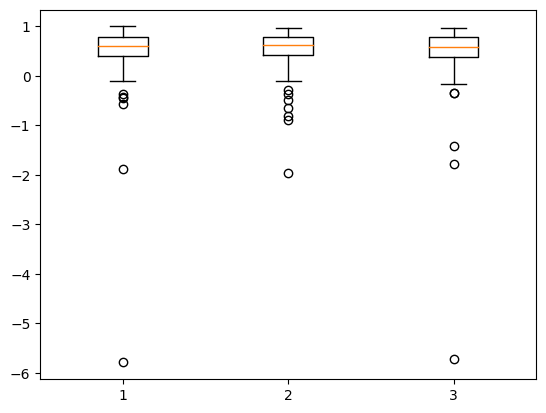

In [14]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

data_set1=np.array([2,3,3,4,4,4,4,5,5,6])
data_set2=np.array([ERT_results["r2"],RF_results["r2"],GBDT_results["r2"]])

#.T将数组data_set2由原来的2行10列转换为2列10行
data_set2=data_set2.T
# plt.boxplot(data_set1)
plt.boxplot(data_set2)

In [7]:
positive_p = pd.read_csv("p_dataframe.csv",index_col=0)

In [14]:
ERT_results[ERT_results["r2"]<0]

,rmse,r2
P04114,1.160178,-0.453700
P01008,4.670607,-0.007552
P01764,0.946555,-0.051215
P69905,4.502806,-0.362129
P05155,0.810985,-0.114831
Q14520,0.925730,-1.875137
Q9UK55,0.790147,-5.792909
P63104,0.312272,-0.115435
Q6Q788,0.186971,-0.575444
P14618,0.129558,-0.000384


In [15]:
positive_p.loc[ERT_results[ERT_results["r2"]<0].index]

,T/sum
P04114,0.658703
P01008,0.616041
P01764,0.438567
P69905,0.482935
P05155,0.488055
Q14520,0.462457
Q9UK55,0.337884
P63104,0.257679
Q6Q788,0.225256
P14618,0.204778


In [16]:
RF_results[RF_results["r2"]<0]

,rmse,r2
P04114,1.123335,-0.362838
P05155,0.801134,-0.087912
P07225,0.921007,-0.494287
Q14520,0.734522,-0.810084
P02743,1.202045,-0.107359
P02763,0.425228,-0.900031
Q9UK55,0.522358,-1.968772
Q13790,0.347281,-0.051586
P02788,0.235106,-0.022514
Q6Q788,0.191159,-0.646823


In [17]:
positive_p.loc[RF_results[RF_results["r2"]<0].index]

,T/sum
P04114,0.658703
P05155,0.488055
P07225,0.489761
Q14520,0.462457
P02743,0.416382
P02763,0.416382
Q9UK55,0.337884
Q13790,0.291809
P02788,0.221843
Q6Q788,0.225256


In [18]:
GBDT_results[GBDT_results["r2"]<0]

,rmse,r2
P04114,1.000323,-0.080701
P01764,0.938110,-0.032541
P05155,0.768280,-0.000512
P07225,0.762541,-0.024318
P35542,1.379950,-0.077016
Q14520,0.911102,-1.784991
P01861,1.653740,-0.348055
Q9UK55,0.785522,-5.713609
P13645,1.330631,-0.111758
Q13790,0.393271,-0.348548


In [45]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset,DataLoader
from torch.autograd import Variable
class DNN(nn.Module):
    def __init__(self,input_size,hidden_size,output_size):
        super(DNN, self).__init__()
        self.linner1 = nn.Linear(input_size,hidden_size)
        self.linner2 = nn.Linear(hidden_size,hidden_size)
        self.linner3 = nn.Linear(hidden_size,output_size)
        self.dropout = nn.Dropout(0.5)
        self.act_fun1 = nn.ReLU()
        self.norm = nn.BatchNorm1d(input_size)
#         self.lstm = nn.LSTM(input_size = input_size,hidden_size=int(hidden_size/2),bidirectional=True)
        self.optimizer = torch.optim.Adam(self.parameters())
        self.sigmoid = nn.Sigmoid()
    def forward(self,X_in):
        # X = self.norm(X_in)
#         X,_ = self.lstm(X)
#         X = self.dropout(X)
#         X = self.act_fun1(X)
        X = self.linner1(X_in)
#         X = self.dropout(X)
#         X = self.act_fun1(X)
#         X = self.linner2(X)
        X = self.dropout(X)
        X = self.act_fun1(X)
        X_out = self.linner3(X)
        X_out = self.act_fun1(X_out)
        # X_out = self.sigmoid(X)
#         X_out = X_out.unsqueeze(-1)
        return X_out

In [46]:
class ProDataset(Dataset):
    def __init__(self,Dataframe_X,Dataframe_Y,Protein_Feature=None,p_id=None):
        self.X = Dataframe_X.values
        self.Y = Dataframe_Y.values
        # self.P_feature = Protein_Feature.loc[p_id].values,
    def __getitem__(self, index):
        label = self.Y[index]
        X = self.X[index]
        # X = np.concatenate([X,self.P_feature.T],axis=0),
        X = torch.tensor(X).float()
        label = torch.tensor(label).float()
        return X,label

    def __len__(self):
        return len(self.Y)

In [47]:
loss_func = nn.MSELoss()
def train_one_epoch(model,dataloader):
    epoch_loss_train = 0
    n = 0
    for i,(NP_Feature,target) in enumerate(dataloader):
        batch_size = NP_Feature.size(0)
        NP_Feature = Variable(NP_Feature.float())
        # cos_target = Variable(cos_target.cuda())
        # target = torch.squeeze(target)
        target = Variable(target)

        # target = torch.tensor(target, dtype=torch.int64)
        # cos_target = torch.tensor(cos_target, dtype=torch.int64)
        # if model.constrative:
        #     output,feature_map,feature_map_noise = model(input)
        #     output = output.squeeze()
        #     _loss = model.loss_func(output, target)
        #     criterion = Cal_Contrastive_loss(batch_size,0.1,1)
        #     cl_loss = 0.05 * criterion(feature_map,feature_map_noise)
        #     loss = _loss + cl_loss
        # else:
        output = model(NP_Feature)
        # output = output.squeeze()
        # cos_loss = cosine_loss(np_embedding,protein_embddeing,cos_target)

        loss = loss_func(output,target)
        # loss = cos_loss+out_loss
        # epoch_loss_train += loss.cpu().detach().numpy()
        epoch_loss_train += loss
        model.optimizer.zero_grad()
        loss.backward()
        model.optimizer.step()
        n += 1
    epoch_loss_train_avg = epoch_loss_train/n
    return epoch_loss_train_avg

def evalute(model,dataloader):
    model.eval()
    epoch_loss = 0.0
    n =0
    pred = []
    true_=[]
    for data in dataloader:
        with torch.no_grad():
            NP_Feature,target= data
            NP_Feature = Variable(NP_Feature.float())

            # Protein_Feature = Variable(Protein_Feature.cuda().float())
            target = Variable(target)
            # cos_target = Variable(cos_target.cuda())
            # target = torch.squeeze(target)
            # target = torch.tensor(target, dtype=torch.int64)
            # cos_target = torch.tensor(cos_target,dtype=torch.int64)
            target_label = target.cpu().detach().numpy()
            # target_label = target
            output = model(NP_Feature)
            # output = output.squeeze()
            # cos_loss = cosine_loss(np_embedding,protein_embedding,cos_target)
            loss = loss_func(output,target)
            # loss = cos_loss + out_loss
            # epoch_loss += loss.cpu().detach().numpy()
            epoch_loss += loss
            # soft = nn.Softmax(dim=1)
            y_pred = output
            # y_pred = soft(output)
            y_pred = y_pred.cpu().detach().numpy()
            # pred += [pred[1] for pred in y_pred]
            pred += [pred_ for pred_ in y_pred]
            true_ += list(target_label)
            n += 1
    epoch_loss_avg = epoch_loss/n
    return epoch_loss_avg,pred,true_

def analysis(y_true,y_pred,best_threshold = 0.5):
    if best_threshold == None:
        best_threshold =0
        best_f1 = 0
        for threshold in range(0,100):
            threshold = threshold/100
            binary_pred = [1 if pred >= threshold else 0 for pred in y_pred ]
            binary_true = y_true
            f1 = metrics.f1_score(binary_true,binary_pred)
            if f1 > best_f1:
                best_f1 = f1
                best_threshold = threshold
    binary_pred = [1 if pred >= best_threshold else 0 for pred in y_pred]
    binary_true = y_true

    binary_acc = metrics.accuracy_score(binary_true, binary_pred)
    precision = metrics.precision_score(binary_true, binary_pred)
    recall = metrics.recall_score(binary_true, binary_pred)
    f1 = metrics.f1_score(binary_true, binary_pred)
    AUC = metrics.roc_auc_score(binary_true, y_pred)
    precisions, recalls, thresholds = metrics.precision_recall_curve(binary_true, y_pred)
    AUPRC = metrics.auc(recalls, precisions)
    mcc = metrics.matthews_corrcoef(binary_true, binary_pred)
    results = {
        'binary_acc': binary_acc,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'AUC': AUC,
        'AUPRC': AUPRC,
        'mcc': mcc,
        'threshold': best_threshold
    }

    return results
def regressor_analysis(y_true,y_pred):

    r2 = metrics.r2_score(y_true,y_pred)
    rmse  = sqrt(mean_squared_error(y_true,y_pred))
    # binary_acc = metrics.accuracy_score(binary_true, binary_pred)
    # precision = metrics.precision_score(binary_true, binary_pred)
    # recall = metrics.recall_score(binary_true, binary_pred)
    # f1 = metrics.f1_score(binary_true, binary_pred)
    # AUC = metrics.roc_auc_score(binary_true, y_pred)
    # precisions, recalls, thresholds = metrics.precision_recall_curve(binary_true, y_pred)
    # AUPRC = metrics.auc(recalls, precisions)
    # mcc = metrics.matthews_corrcoef(binary_true, binary_pred)
    results = {
        'r2': r2,
        'rmse': rmse,
    }

    return results

def analysis_test(y_true,y_pred,best_threshold = None):
    best_f1 = 0
    best_acc = 0
    best_recall = 0
    best_precision = 0
    best_AUC = 0
    best_mcc = 0
    if best_threshold == None:
        best_threshold = 0
        threshold_ = pd.DataFrame(columns=["acc", "precision","recall","f1","AUC","AUPRC","mcc"])
        for threshold in range(0, 100):
            threshold = threshold / 100
            binary_pred = [1 if pred >= threshold else 0 for pred in y_pred]
            binary_true = y_true
            binary_acc = metrics.accuracy_score(binary_true, binary_pred)
            precision = metrics.precision_score(binary_true, binary_pred)
            recall = metrics.recall_score(binary_true, binary_pred)
            f1 = metrics.f1_score(binary_true, binary_pred)
            AUC = metrics.roc_auc_score(binary_true, y_pred)
            precisions, recalls, thresholds = metrics.precision_recall_curve(binary_true, y_pred)
            AUPRC = metrics.auc(recalls, precisions)
            mcc = metrics.matthews_corrcoef(binary_true, binary_pred)
            threshold_.loc[threshold] = [binary_acc,precision,recall,f1,AUC,AUPRC,mcc]
            if f1 > best_f1:
                best_acc = binary_acc
                best_recall = recall
                best_f1 = f1
                best_precision = precision
                best_threshold = threshold
                best_AUC = AUC
                best_mcc = mcc

        # threshold_.to_csv(\./DNN_Model_results/{}_about_threshold.csv\.format(modelname))
    binary_pred = [1 if pred >= best_threshold else 0 for pred in y_pred]
    binary_true = y_true
    # final_acc = metrics.accuracy_score(binary_true, binary_pred)
    # final_recall = metrics.recall_score(binary_true, binary_pred)
    # avg_metrics = float(final_acc + final_recall) / 2

    return best_f1, best_acc,best_recall,best_precision,best_AUC,best_mcc,best_threshold,binary_pred,binary_true

In [51]:
from warnings import filterwarnings
from imblearn.over_sampling import SMOTE
from sklearn import metrics
filterwarnings("ignore")
SEED = 2024
np.random.seed(SEED)
torch.manual_seed(SEED)
metrics_train = pd.DataFrame(columns=["train_loss","AUROC","Recall","Precision","F1","MCC","ACC"])
# metrics_test = pd.DataFrame(columns=["AUROC","Recall","Precision","F1","MCC","ACC"])
metrics_test = pd.DataFrame(columns=["rmse","r2"])
ALL_RPA = pd.read_csv("./Data/PROTEIN_RPA.csv",index_col=0)
protein_id = ALL_RPA.columns
for p_id in tqdm(protein_id):
    train_data = pd.read_csv("./Protein_data/" + p_id + "_Regressor_Train_data.csv",index_col=0)
    test_data = pd.read_csv("./Protein_data/" + p_id + "_Regressor_Test_data.csv",index_col=0)
    del train_data["Title"]
    del test_data["Title"]
    Train_X = train_data.iloc[:,:-1]
    Train_y = train_data.iloc[:,-1]
    Test_X = test_data.iloc[:,:-1]
    Test_y = test_data.iloc[:,-1]
    Train_y.index = [i for i in range(len(Train_y))]
    Test_y.index = [i for i in range(len(Test_y))]
    Train_y = pd.DataFrame(Train_y)
    Test_y = pd.DataFrame(Test_y)
    scaler = MinMaxScaler()
    scaler.fit(Train_X)
    Train_X = scaler.transform(Train_X)
    Train_X = pd.DataFrame(Train_X)
    # smote = SMOTE(random_state=1412)
    # train_X_new,train_y_new = smote.fit_resample(Train_X,Train_y)
    # train_pca = PCA(n_components=54,random_state=1412)
    # dim_reduce_X = train_pca.fit_transform(Train_X,Train_y)
    # P_feature = Protein_F.loc[p_id]
    # new_feature = dim_reduce_X @ P_feature
    # new_feature = pd.DataFrame(new_feature)
    # Train_X = pd.concat([Train_X,new_feature],axis=1)
    # protein_f = pd.DataFrame(Protein_Feature.loc[p_id]).T
    # protein_train = pd.DataFrame()
    # for i in range(len(Train_X)):
    #     protein_train = pd.concat([protein_train,protein_f],axis=0)
    # protein_train.index = [i for i in range(len(protein_train))]
    # Train_X = pd.concat([Train_X,protein_train],axis=1)
    Test_X = scaler.transform(Test_X)
    Test_X = pd.DataFrame(Test_X)
    # dim_reduce_X_test = train_pca.transform(Test_X)
    # new_feature_test = dim_reduce_X_test @ P_feature
    # new_feature_test = pd.DataFrame(new_feature_test)
    # Test_X = pd.concat([Test_X,new_feature_test],axis=1)
    # protein_test = pd.DataFrame()
    # for j in range(len(Test_X)):
    #     protein_test = pd.concat([protein_test,protein_f],axis=0)
    # protein_test.index = [i for i in range(len(protein_test))]
    # Test_X = pd.concat([Test_X,protein_test],axis=1)
    # cv = KFold(n_splits=5,shuffle=True,random_state=1412)
    # fold = 0
    # f1_score = 0
    # acc = 0
    # recall = 0
    # precision = 0
    # AUC = 0
    # MCC = 0
    # r2 = 0
    # rmse = 0
    # for train,valid in cv.split(Train_X,Train_y):
    #     x_,X_valid = Train_X.iloc[train,:],Train_X.iloc[valid,:]
    #     y_,Y_valid = Train_y.iloc[train,:],Train_y.iloc[valid,:]
    #     Model = DNN(129,256,2)
    #     train_loader = DataLoader(dataset=ProDataset(x_,y_),batch_size=32,shuffle=True)
    #     valid_loader = DataLoader(dataset=ProDataset(X_valid,Y_valid),batch_size=32,shuffle=True)
    #     test_loader = DataLoader(dataset=ProDataset(Test_X,Test_y),batch_size=32,shuffle=True)
    #
    #     for epoch in range(30):
    #         Model.train()
    #         epoch_train_loss_avg = train_one_epoch(Model,train_loader)
    #         # epoch_train_loss,train_pred,train_true = evalute(Model,train_loader)
    #         # train_result = analysis(train_true,train_pred)
    #         # epoch_val_loss,val_pred,val_true = evalute(Model,valid_loader)
    #         # result_valid = analysis(val_true,val_pred)
    #         epoch_test_loss, test_pred, test_true = evalute(Model, test_loader)
    #         modelname_ = p_id + '_Fold' + str(fold) + '_' + str(epoch + 1)
    #         best_f1, best_acc,best_recall,best_precision,best_AUC,best_mcc,best_threshold =  analysis_test(test_true, test_pred)
    #
    #         if best_f1 > f1_score :
    #             # best_epoch = epoch+1
    #             # best_test_avg = test_avg_metrics
    #             f1_score = best_f1
    #             acc = best_acc
    #             recall = best_recall
    #             precision = best_precision
    #             AUC = best_AUC
    #             MCC = best_mcc
    #             # recall = best_recall
    #             # acc = best_acc
    #             # r2 = result_test["r2"]
    #             # rmse = result_test["rmse"]
    #
    #
    #             torch.save(Model.state_dict(), os.path.join("./DNN_Model",p_id + '_DNN_best.pkl'))
    #     # print(\{}_best_F1_SCORE:{}\.format(p_id,fold,f1_score))
    #     fold += 1
    Full_train_loader = DataLoader(dataset=ProDataset(Train_X,Train_y),batch_size=32,shuffle=True)
    Full_test_loader = DataLoader(dataset=ProDataset(Test_X,Test_y),batch_size=32,shuffle=True)
    Full_Model = DNN(129,256,1)
    # Full_f1_score = 0
    # Full_acc = 0
    # Full_recall = 0
    # Full_precision = 0
    # Full_AUC = 0
    # Full_MCC = 0
    # Full_r2 = 0
    # Full_rmse = 0
    for epoch_ in range(100):
            Full_Model.train()
            epoch_train_loss_avg = train_one_epoch(Full_Model,Full_train_loader)
#             epoch_train_loss,train_pred,train_true = evalute(Full_Model,Full_train_loader)
#             train_result = analysis(train_true,train_pred)
#             metrics_train.loc[epoch_] = [epoch_train_loss,train_result["AUC"],train_result["recall"],train_result["precision"],train_result["f1"],train_result["mcc"],train_result["binary_acc"]]
#     metrics_train.to_csv("./DNN_train_OS_results/"+p_id+"_train.csv")
            #

    epoch_test_loss, test_pred, test_true = evalute(Full_Model, Full_test_loader)
    # modelname_ = 'Fold' + str(fold) + '_' + str(epoch_ + 1)
    test_result= regressor_analysis(test_true, test_pred)
    metrics_test.loc[p_id]=[test_result["rmse"],test_result["r2"]]

    # if full_best_f1 > Full_f1_score :
    #     # best_epoch = epoch+1
    #     # best_test_avg = test_avg_metrics
    #     Full_f1_score = full_best_f1
    #     Full_acc = full_best_acc
    #     Full_recall = full_best_recall
    #     Full_precision = full_best_precision
    #     Full_AUC = full_best_AUC
    #     Full_MCC = full_best_mcc
    #     # recall = best_recall
    #     # acc = best_acc
    #     # Full_r2 = full_result_test["r2"]
    #     # Full_rmse = full_result_test["rmse"]
    #     if Full_f1_score > f1_score:
    torch.save(Full_Model.state_dict(), os.path.join("./DNN_OS_50_final_Model",p_id + '_DNN_best.pkl'))

    # if Full_f1_score > f1_score:
    #     metrics_test.loc[p_id] = [Full_AUC,Full_recall,Full_precision,Full_f1_score,Full_MCC,Full_acc]
    #     # metrics_test.loc[p_id] = [Full_rmse,Full_r2]
    #     # print(\{}_best_R2:{}\.format(p_id,Full_r2))
    # else:
    #     metrics_test.loc[p_id] = [AUC,recall,precision,f1_score,MCC,acc]
        # metrics_test.loc[p_id] = [rmse,r2]
        # print(\{}_best_R2:{}\.format(p_id,r2))

metrics_test.to_csv("./Regressor_Model_results/DNN_Regressor_test_results.csv")

100%|██████████| 178/178 [02:10<00:00,  1.36it/s]


In [8]:
concat_r2_T = concat_r2.T

In [9]:
result_ = concat_r2_T == concat_r2_T.max()

In [10]:
result = result_.T

In [11]:
ERT_MAX = concat_r2["ERT"][result["ERT"]]

In [12]:
RF_MAX = concat_r2["RF"][result["RF"]]

In [13]:
GBDT_MAX = concat_r2["GBDT"][result["GBDT"]]

In [13]:
ERT_MAX_CONCAT = pd.concat([ERT_MAX[ERT_MAX<0.5],positive_p.loc[ERT_MAX[ERT_MAX<0.5].index]],axis=1)

In [14]:
RF_MAX_CONCAT = pd.concat([RF_MAX[RF_MAX<0.5],positive_p.loc[RF_MAX[RF_MAX<0.5].index]],axis=1)

In [15]:
GBDT_MAX_CONCAT = pd.concat([GBDT_MAX[GBDT_MAX<0.5],positive_p.loc[GBDT_MAX[GBDT_MAX<0.5].index]],axis=1)

In [28]:
GBDT_MAX

P04004    0.379413
P10909    0.939863
P01042    0.328797
P01859    0.606317
P04196    0.477443
P04114   -0.080701
P02766    0.652746
P06396    0.926308
P06727    0.488911
Q14624    0.342554
P01008    0.245041
P04003    0.490562
P0C0L4    0.635909
P02675    0.391776
P01011    0.870114
P05155   -0.000512
P02654    0.947478
P60709    0.557825
P04217    0.811336
P02763    0.592440
P49908    0.795089
P13671    0.767026
P01615    0.886013
P00742    0.607460
P03951    0.546066
Q06033    0.491572
Q96IY4    0.586135
P04433    0.933837
P01599    0.511020
P49747    0.744743
P35908    0.861535
P08514    0.911923
P63104    0.714998
Q86UX7    0.382180
P22352    0.855271
P62937    0.920709
P48740    0.434480
P25311    0.836021
P43652    0.909147
P35527    0.453358
P05106    0.968278
P18206    0.241809
P01701    0.858140
Q96PD5    0.952644
O00391    0.900875
P23142    0.841195
P12814    0.159671
Q13201    0.892244
P0DOY3    0.573011
P81605    0.774862
P02533    0.451077
Name: GBDT, dtype: float64

In [29]:
ERT_MAX_CONCAT

,ERT,T/sum
B9A064,0.321369,0.430034
P07225,0.000842,0.489761
P05154,0.461068,0.460751
P03952,0.403086,0.465870
P05546,0.382493,0.416382
P01019,0.319782,0.423208
P35542,0.176312,0.412969
P02743,0.172380,0.416382
P01861,0.325296,0.390785
P15169,0.242844,0.261092


In [30]:
RF_MAX_CONCAT

,RF,T/sum
P02647,0.461265,0.914676
P01764,0.028765,0.438567
P00747,0.294160,0.552901
P01766,0.036752,0.508532
Q14520,-0.810084,0.462457
P18428,0.367649,0.407850
P00748,0.484223,0.402730
P0DJI8,0.364324,0.348123
Q13103,0.443425,0.329352
Q9UK55,-1.968772,0.337884


In [31]:
GBDT_MAX_CONCAT

,GBDT,T/sum
P04004,0.379413,0.795222
P01042,0.328797,0.679181
P04196,0.477443,0.682594
P04114,-0.080701,0.658703
P06727,0.488911,0.674061
Q14624,0.342554,0.650171
P01008,0.245041,0.616041
P04003,0.490562,0.614334
P02675,0.391776,0.580205
P05155,-0.000512,0.488055


In [32]:
concat_r2.loc[ERT_MAX_CONCAT.index]

,ERT,RF,GBDT
B9A064,0.321369,0.273326,0.289573
P07225,0.000842,-0.494287,-0.024318
P05154,0.461068,0.409299,0.246834
P03952,0.403086,0.339657,0.398340
P05546,0.382493,0.379436,0.297084
P01019,0.319782,0.263112,0.276688
P35542,0.176312,0.139020,-0.077016
P02743,0.172380,-0.107359,0.006851
P01861,0.325296,0.209048,-0.348055
P15169,0.242844,0.205338,0.002154


In [171]:
ert_set = set(concat_r2["ERT"][concat_r2["ERT"]>0.5].index)
rf_set = set(concat_r2["RF"][concat_r2["RF"]>0.5].index)
gbdt_set = set(concat_r2["GBDT"][concat_r2["GBDT"]>0.5].index)

In [174]:
JIAO = ert_set & rf_set & gbdt_set

In [177]:
JIAO = list(JIAO)
concat_r2.loc[JIAO]

,ERT,RF,GBDT
P00751,0.767211,0.700026,0.664367
P09871,0.912700,0.883643,0.797637
P12259,0.578115,0.662376,0.597222
P00734,0.620148,0.624175,0.567422
P01619,0.977503,0.970944,0.891741
...,...,...,...
P25311,0.785767,0.787344,0.836021
P01024,0.621643,0.501811,0.573668
P02749,0.686298,0.656341,0.634604
P02787,0.601971,0.622168,0.596253


In [14]:
ERT_MAX_CONCAT_2 = pd.concat([ERT_MAX[ERT_MAX>0.5],positive_p.loc[ERT_MAX[ERT_MAX>0.5].index]],axis=1)

In [15]:
RF_MAX_CONCAT_2 = pd.concat([RF_MAX[RF_MAX>0.5],positive_p.loc[RF_MAX[RF_MAX>0.5].index]],axis=1)

In [16]:
GBDT_MAX_CONCAT_2 = pd.concat([GBDT_MAX[GBDT_MAX>0.5],positive_p.loc[GBDT_MAX[GBDT_MAX>0.5].index]],axis=1)

In [39]:
filterwarnings("ignore")
col_name_without_oh = list(colums_name[:13]) +  ["NP without modification","Surface modification","Incubation protein source","NP type","NP shape","Dispersion medium","Incubation culture","Modification type"]
a =  pd.DataFrame(index=col_name_without_oh)
col_name_without_oh = a.index
feature_impotance = pd.DataFrame(columns=col_name_without_oh)

In [66]:
filterwarnings("ignore")
col_name_without_oh = list(colums_name[:13]) +  ["NP without modification","Surface modification","Incubation protein source","NP type","NP shape","Dispersion medium","Incubation culture","Modification type"]
a =  pd.DataFrame(index=col_name_without_oh)
col_name_without_oh = a.index
feature_impotance = pd.DataFrame(columns=col_name_without_oh)
# Feature_Importance = pd.DataFrame(columns=[1,2,3,4,5,6,7,8,9,10])
for p_id in list(GBDT_MAX_CONCAT_2.index):
    model = joblib.load("./GBDT_Regressor_Model/" + p_id + "_GBDT_best.pkl")

    feature_important = list(model.feature_importances_)
    feature_important = feature_important[:13]+[sum(feature_important[13:53])]+[sum(feature_important[53:103])]+[sum(feature_important[103:108])]+[sum(feature_important[108:112])]+[sum(feature_important[112:118])]+[sum(feature_important[118:123])]+[sum(feature_important[123:126])]+[sum(feature_important[126:])]
    feature_impotance.loc[p_id] = feature_important
    #     feature_important = pd.DataFrame(feature_important)
#     top10 = feature_important.sort_values(by=[0],ascending=False)[:10].index
#     Feature_Importance.loc[p_id] = col_name_without_oh[top10]

In [22]:
a = list(ERT_MAX_CONCAT_2.index) + list(RF_MAX_CONCAT_2.index) + list(GBDT_MAX_CONCAT_2.index)
s =[]
for i in a:
    s.append("<option>"+i+"</option>")
s

['<option>P01024</option>',
 '<option>P02768</option>',
 '<option>P01834</option>',
 '<option>P01009</option>',
 '<option>P01857</option>',
 '<option>P01619</option>',
 '<option>P02671</option>',
 '<option>P08603</option>',
 '<option>P02765</option>',
 '<option>P68871</option>',
 '<option>P01876</option>',
 '<option>P02749</option>',
 '<option>P00751</option>',
 '<option>P08697</option>',
 '<option>P19827</option>',
 '<option>P02760</option>',
 '<option>P07996</option>',
 '<option>P00738</option>',
 '<option>P04406</option>',
 '<option>P09871</option>',
 '<option>P55056</option>',
 '<option>P01591</option>',
 '<option>Q92954</option>',
 '<option>P01031</option>',
 '<option>P06312</option>',
 '<option>P04070</option>',
 '<option>P05090</option>',
 '<option>P02745</option>',
 '<option>P00488</option>',
 '<option>P01700</option>',
 '<option>P10643</option>',
 '<option>P07358</option>',
 '<option>P05452</option>',
 '<option>P20851</option>',
 '<option>P07357</option>',
 '<option>O95445</op

In [35]:
import joblib

for p_id in list(GBDT_MAX_CONCAT_2.index):
    train_data = pd.read_csv("./Protein_data/" + p_id + "_Regressor_Train_data.csv",index_col=0)
    test_data = pd.read_csv("./Protein_data/" + p_id + "_Regressor_Test_data.csv",index_col=0)
    del train_data["Title"]
    del test_data["Title"]
    Train_X = train_data.iloc[:,:-1]
    Train_y = train_data.iloc[:,-1]
    Test_X = test_data.iloc[:,:-1]
    Test_y = test_data.iloc[:,-1]
    Train_y.index = [i for i in range(len(Train_y))]
    Test_y.index = [i for i in range(len(Test_y))]
    Train_y = pd.DataFrame(Train_y)
    Test_y = pd.DataFrame(Test_y)
    scaler = MinMaxScaler()
    scaler.fit(Train_X)
    joblib.dump(scaler,"./Regression_scaler/" + p_id + ".pkl")
for p_id in list(ERT_MAX_CONCAT_2.index):
    train_data = pd.read_csv("./Protein_data/" + p_id + "_Regressor_Train_data.csv",index_col=0)
    test_data = pd.read_csv("./Protein_data/" + p_id + "_Regressor_Test_data.csv",index_col=0)
    del train_data["Title"]
    del test_data["Title"]
    Train_X = train_data.iloc[:,:-1]
    Train_y = train_data.iloc[:,-1]
    Test_X = test_data.iloc[:,:-1]
    Test_y = test_data.iloc[:,-1]
    Train_y.index = [i for i in range(len(Train_y))]
    Test_y.index = [i for i in range(len(Test_y))]
    Train_y = pd.DataFrame(Train_y)
    Test_y = pd.DataFrame(Test_y)
    scaler = MinMaxScaler()
    scaler.fit(Train_X)
    joblib.dump(scaler,"./Regression_scaler/" + p_id + ".pkl")
for p_id in list(RF_MAX_CONCAT_2.index):
    train_data = pd.read_csv("./Protein_data/" + p_id + "_Regressor_Train_data.csv",index_col=0)
    test_data = pd.read_csv("./Protein_data/" + p_id + "_Regressor_Test_data.csv",index_col=0)
    del train_data["Title"]
    del test_data["Title"]
    Train_X = train_data.iloc[:,:-1]
    Train_y = train_data.iloc[:,-1]
    Test_X = test_data.iloc[:,:-1]
    Test_y = test_data.iloc[:,-1]
    Train_y.index = [i for i in range(len(Train_y))]
    Test_y.index = [i for i in range(len(Test_y))]
    Train_y = pd.DataFrame(Train_y)
    Test_y = pd.DataFrame(Test_y)
    scaler = MinMaxScaler()
    scaler.fit(Train_X)
    joblib.dump(scaler,"./Regression_scaler/" + p_id + ".pkl")
    #     feature_important = pd.DataFrame(feature_important)
#     top10 = feature_important.sort_values(by=[0],ascending=False)[:10].index
#     Feature_Importance.loc[p_id] = col_name_without_oh[top10]

In [67]:
feature_impotance.to_csv("gbdt_regressor_protein_cor.csv")

In [68]:
regresor_p_cor= pd.read_csv("GBDT_p_regressor_correlation_results.csv",index_col=0)

In [69]:
regresor_p_cor = regresor_p_cor.T

In [70]:
regressor_p_cor = pd.DataFrame(regresor_p_cor.mean()).sort_values(by=[0],ascending=False)

In [71]:
regresor_p_cor1= pd.read_csv("gbdt_regressor_protein_cor.csv",index_col=0)
regresor_p_cor1 = regresor_p_cor1.loc[regressor_p_cor.index]

In [72]:
regresor_p_cor1.to_csv("GBDT_regressor_p_cor.csv")

In [8]:
import shap
shap.initjs()
from pdpbox import info_plots,pdp,get_dataset
import matplotlib.pyplot as plt

In [5]:
train_data = pd.read_csv("./Protein_data/P55056_Regressor_Train_data.csv",index_col=0)
test_data = pd.read_csv("./Protein_data/P55056_Regressor_Test_data.csv",index_col=0)
del train_data["Title"]
del test_data["Title"]
Train_X = train_data.iloc[:,:-1]
Train_y = train_data.iloc[:,-1]
Test_X = test_data.iloc[:,:-1]
Test_y = test_data.iloc[:,-1]
Train_y.index = [i for i in range(len(Train_y))]
Test_y.index = [i for i in range(len(Test_y))]
Train_y = pd.DataFrame(Train_y)
Test_y = pd.DataFrame(Test_y)
scaler = MinMaxScaler()
scaler.fit(Train_X)
Train_X = scaler.transform(Train_X)
Train_X = pd.DataFrame(Train_X)
Test_X = scaler.transform(Test_X)
Test_X = pd.DataFrame(Test_X)
Test_X.columns = colums_name.to_list()
Train_X.columns = colums_name.to_list()

In [6]:
model = joblib.load("./ERT_Regressor_Model/P55056_ERT_best.pkl")

C:\Users\admin\anaconda3\lib\site-packages\sklearn\base.py:329: UserWarning: Trying to unpickle estimator ExtraTreeRegressor from version 1.2.2 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  warnings.warn(
C:\Users\admin\anaconda3\lib\site-packages\sklearn\base.py:329: UserWarning: Trying to unpickle estimator ExtraTreesRegressor from version 1.2.2 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [91]:
pdpios = pdp.pdp_isolate(model,Train_X,model_features=colums_name.to_list(),feature="NP without modification_Au")

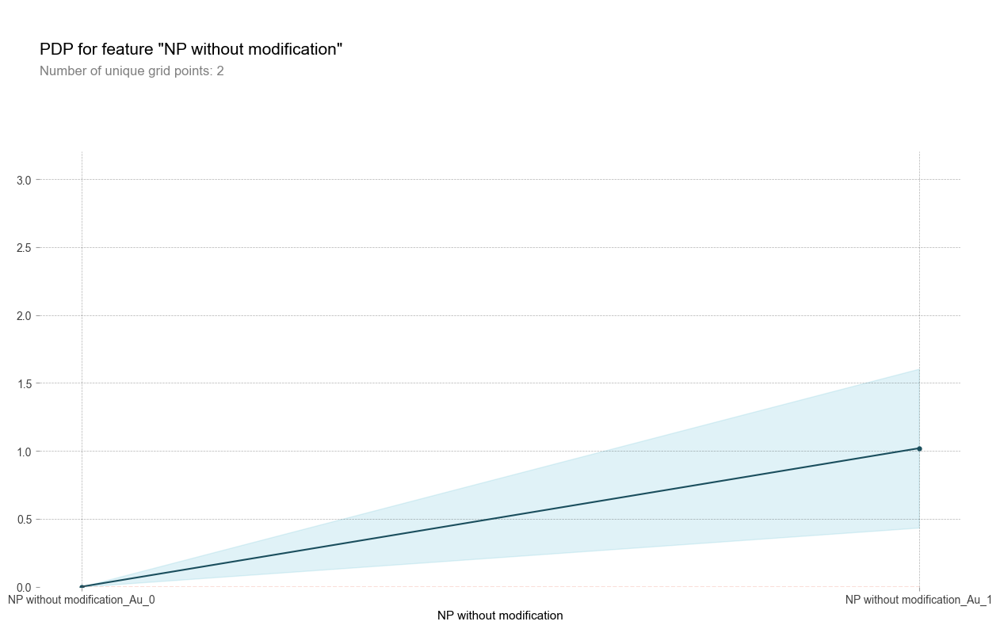

In [92]:
pdp.pdp_plot(pdpios, "NP without modification")
plt.show()

In [99]:
pdpios_sm = pdp.pdp_isolate(model,Train_X,model_features=Test_X.columns.to_list(),feature="Incubation plasma concentration (v/v%)")

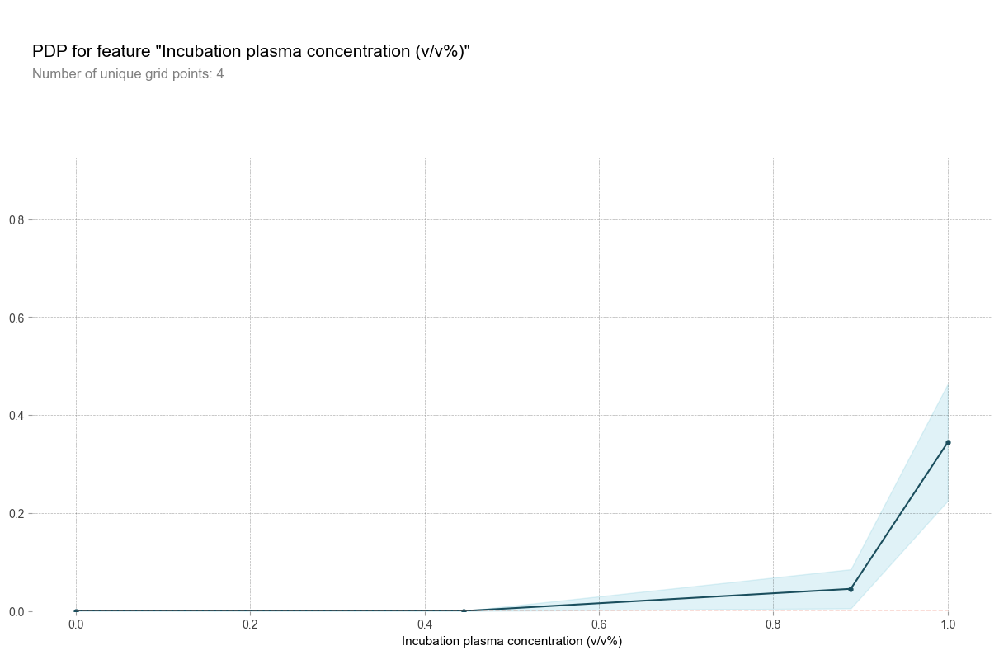

In [100]:
pdp.pdp_plot(pdpios_sm, "Incubation plasma concentration (v/v%)")
plt.show()

In [79]:
Test_X.columns = colums_name.tolist()

In [101]:
pdpios_ipc = pdp.pdp_isolate(model,Train_X,model_features=Test_X.columns.to_list(),feature="NP without modification_Si")

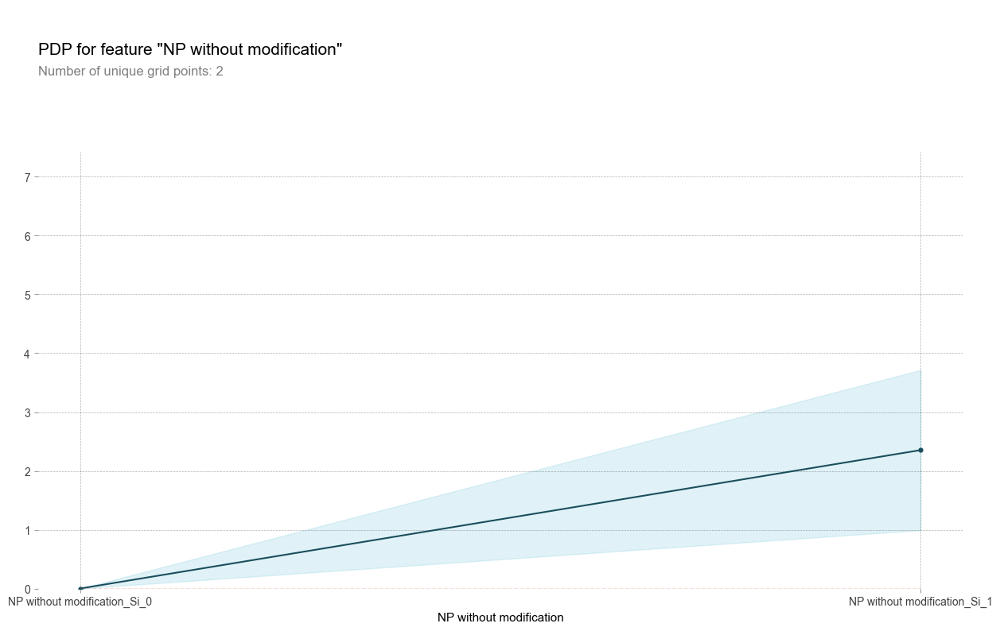

In [102]:
pdp.pdp_plot(pdpios_ipc, "NP without modification")
plt.show()

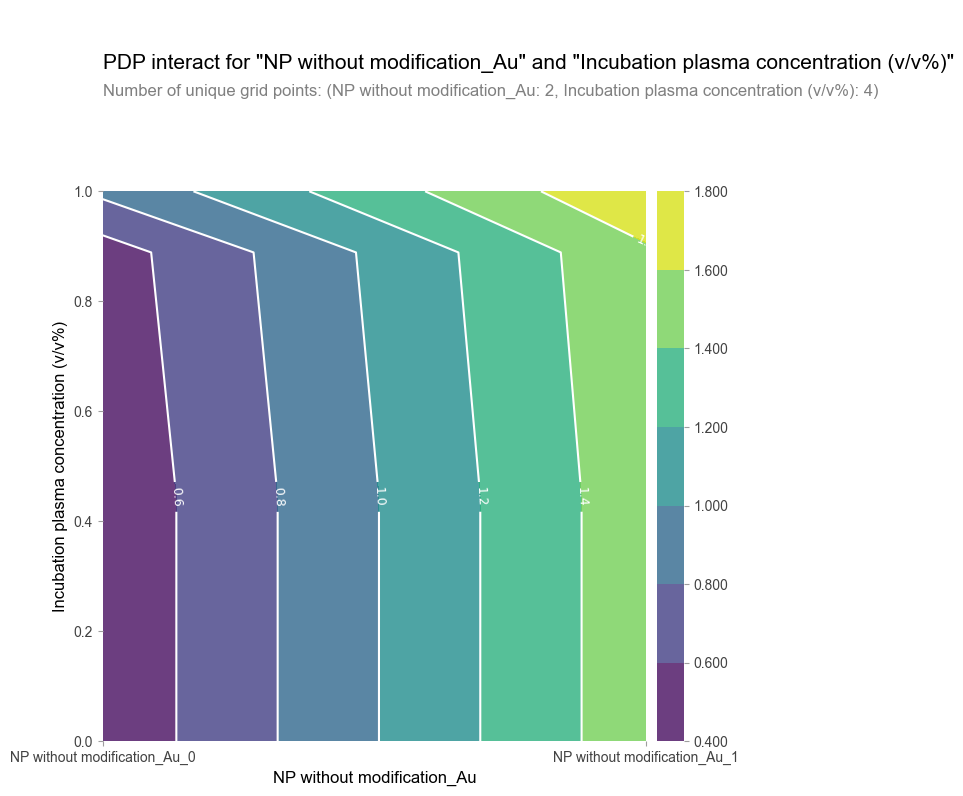

In [103]:
feature1 = "NP without modification_Au"
feature2 = "Incubation plasma concentration (v/v%)"
inter1 = pdp.pdp_interact(model,Train_X,model_features=colums_name.to_list(),features=[feature1,feature2])
fig,axes = pdp.pdp_interact_plot(pdp_interact_out=inter1,feature_names=[feature1,feature2],plot_type="contour")

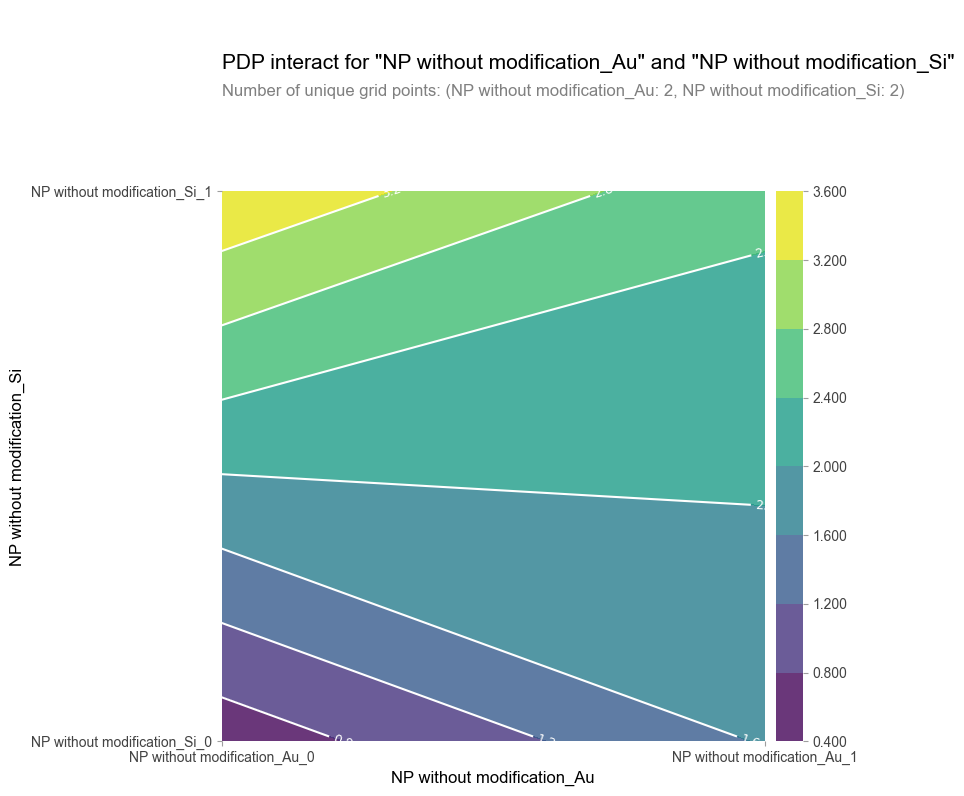

In [11]:
feature1 = "NP without modification_Au"
feature2 = "NP without modification_Si"
inter1 = pdp.pdp_interact(model,Train_X,model_features=colums_name.to_list(),features=[feature1,feature2])
fig,axes = pdp.pdp_interact_plot(pdp_interact_out=inter1,feature_names=[feature1,feature2],plot_type="contour")

In [30]:
colums_name
# colums_name.tolist().index("NP without modification_Au")

Index(['SizeTEM (nm)', 'Zeta potential',
       'Incubation plasma concentration (v/v%)',
       'Incubation NP concentration (mg/L)', 'Centrifugation speed (g)',
       'Centrifugation time （min）', 'Certrifugation temperature (℃)',
       'Dispersion medium pH', 'SizeDLS (nm)', 'PDI',
       ...
       'Dispersion medium_buffer', 'Dispersion medium_cell culture',
       'Dispersion medium_plasma', 'Dispersion medium_water',
       'Incubation culture_DMEM', 'Incubation culture_buffer',
       'Incubation culture_water', 'Modification type_Anionic',
       'Modification type_Cationic', 'Modification type_Neutral'],
      dtype='object', length=129)

In [181]:
explainer_P55056 = shap.TreeExplainer(model)
EX_P55056 = explainer_P55056(Train_X,Train_y)

In [182]:
EX_P55056.values.shape

(194, 129)

In [183]:
EX_P55056.feature_names = colums_name.to_list()

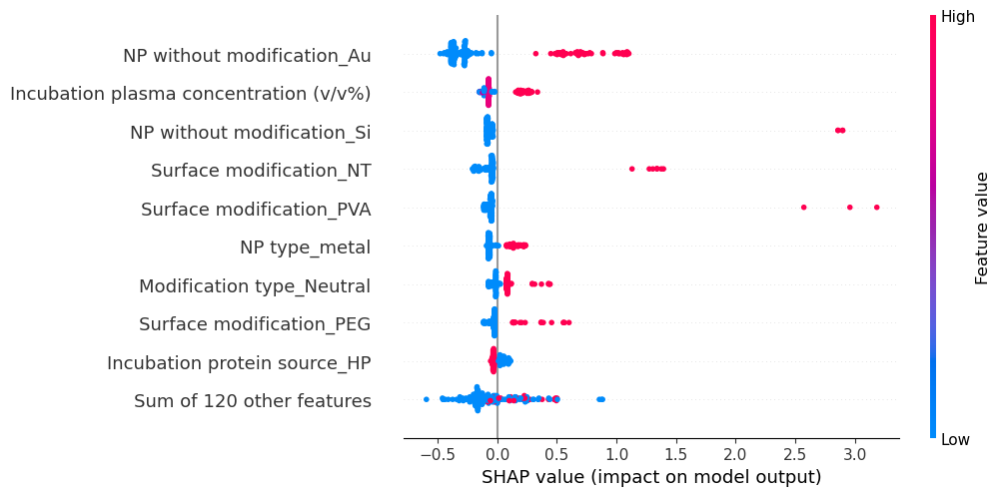

In [81]:
shap.plots.beeswarm(EX_P55056)

In [184]:
EX_P55056.values = np.concatenate([EX_P55056.values[:,:13],np.sum(EX_P55056.values[:,13:53],axis=1).reshape(194,1),np.sum(EX_P55056.values[:,53:103],axis=1).reshape(194,1),np.sum(EX_P55056.values[:,103:108],axis=1).reshape(194,1),np.sum(EX_P55056.values[:,108:112],axis=1).reshape(194,1),np.sum(EX_P55056.values[:,112:118],axis=1).reshape(194,1),np.sum(EX_P55056.values[:,118:123],axis=1).reshape(194,1),np.sum(EX_P55056.values[:,123:126],axis=1).reshape(194,1),np.sum(EX_P55056.values[:,126:],axis=1).reshape(194,1)],axis = 1)

In [185]:
EX_P55056.data = np.concatenate([EX_P55056.data[:,:13],np.sum(EX_P55056.data[:,13:53],axis=1).reshape(194,1),np.sum(EX_P55056.data[:,53:103],axis=1).reshape(194,1),np.sum(EX_P55056.data[:,103:108],axis=1).reshape(194,1),np.sum(EX_P55056.data[:,108:112],axis=1).reshape(194,1),np.sum(EX_P55056.data[:,112:118],axis=1).reshape(194,1),np.sum(EX_P55056.data[:,118:123],axis=1).reshape(194,1),np.sum(EX_P55056.data[:,123:126],axis=1).reshape(194,1),np.sum(EX_P55056.data[:,126:],axis=1).reshape(194,1)],axis = 1)

In [186]:
EX_P55056.feature_names = col_name_without_oh.to_list()

In [187]:
shap.force_plot(explainer_P55056.expected_value,EX_P55056.values,EX_P55056.data,EX_P55056.feature_names)

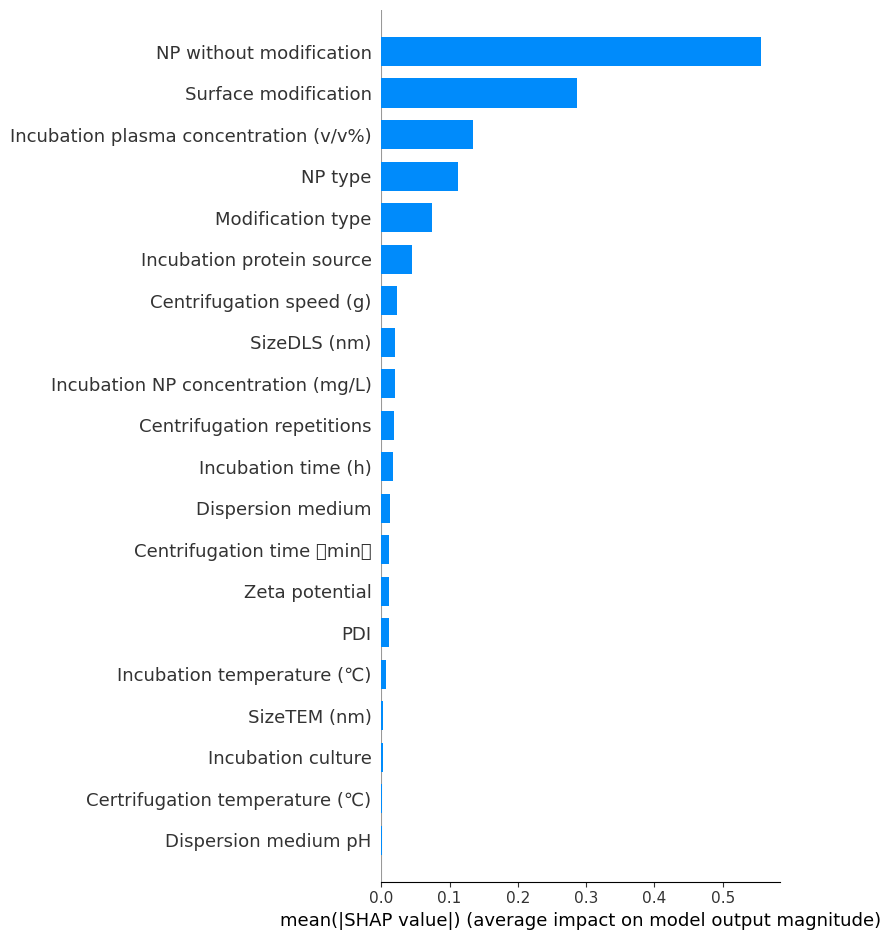

In [188]:
shap.summary_plot(EX_P55056,plot_type="bar")

In [107]:
train_data = pd.read_csv("./Protein_data/P22891_Regressor_Train_data.csv",index_col=0)
test_data = pd.read_csv("./Protein_data/P22891_Regressor_Test_data.csv",index_col=0)
del train_data["Title"]
del test_data["Title"]
Train_X = train_data.iloc[:,:-1]
Train_y = train_data.iloc[:,-1]
Test_X = test_data.iloc[:,:-1]
Test_y = test_data.iloc[:,-1]
Train_y.index = [i for i in range(len(Train_y))]
Test_y.index = [i for i in range(len(Test_y))]
Train_y = pd.DataFrame(Train_y)
Test_y = pd.DataFrame(Test_y)
scaler = MinMaxScaler()
scaler.fit(Train_X)
Train_X = scaler.transform(Train_X)
Train_X = pd.DataFrame(Train_X)
Test_X = scaler.transform(Test_X)
Test_X = pd.DataFrame(Test_X)

In [108]:
model = joblib.load("./RF_Regressor_Model/P22891_RF_best.pkl")

In [109]:
colums_name
colums_name.tolist().index("NP type_other")

111

In [111]:
Test_X.columns = colums_name.to_list()
Train_X.columns = colums_name.to_list()

In [112]:
pdpios_cs = pdp.pdp_isolate(model,Test_X,model_features=Train_X.columns.to_list(),feature="Centrifugation speed (g)")

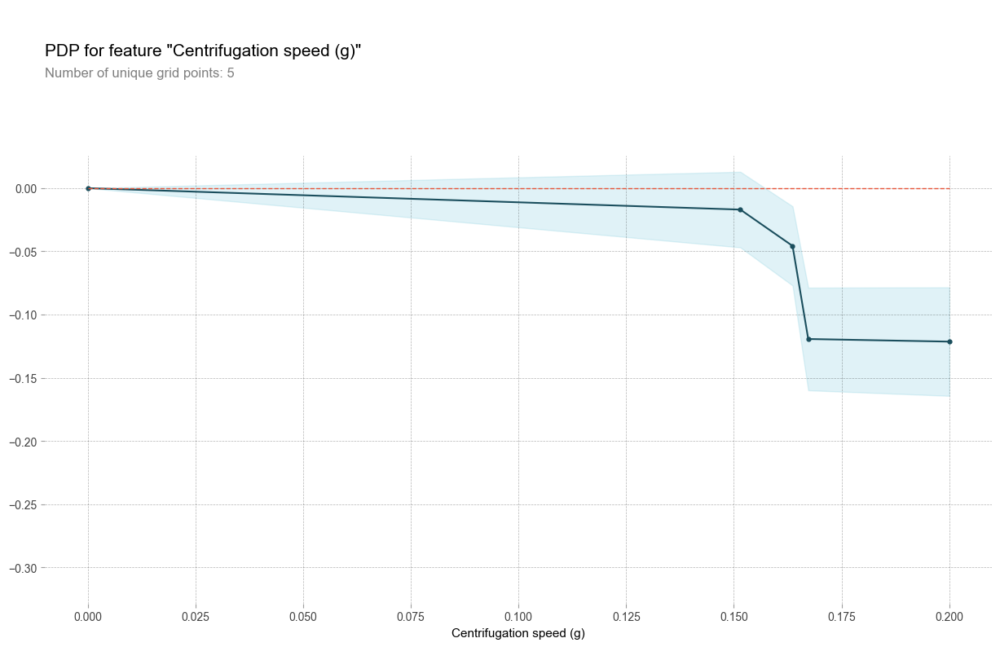

In [113]:
pdp.pdp_plot(pdpios_cs, "Centrifugation speed (g)")
plt.show()

In [114]:
pdpios_pdi = pdp.pdp_isolate(model,Train_X,model_features=Test_X.columns.to_list(),feature="PDI")

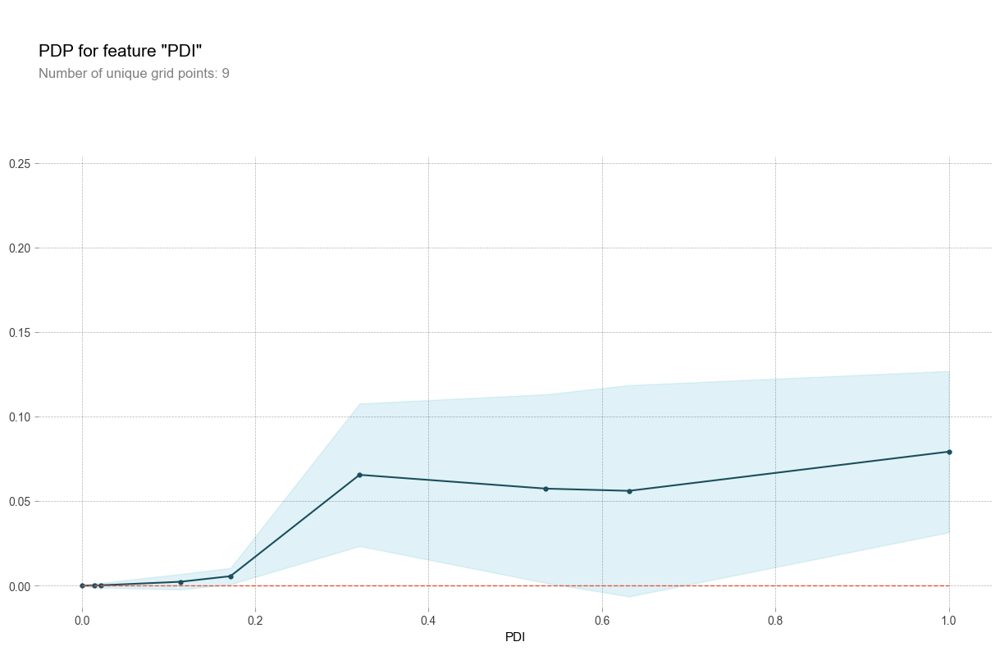

In [115]:
pdp.pdp_plot(pdpios_pdi, "PDI")
plt.show()

In [118]:
pdpios_np_type = pdp.pdp_isolate(model,Train_X,model_features=Test_X.columns.to_list(),feature="Incubation NP concentration (mg/L)")

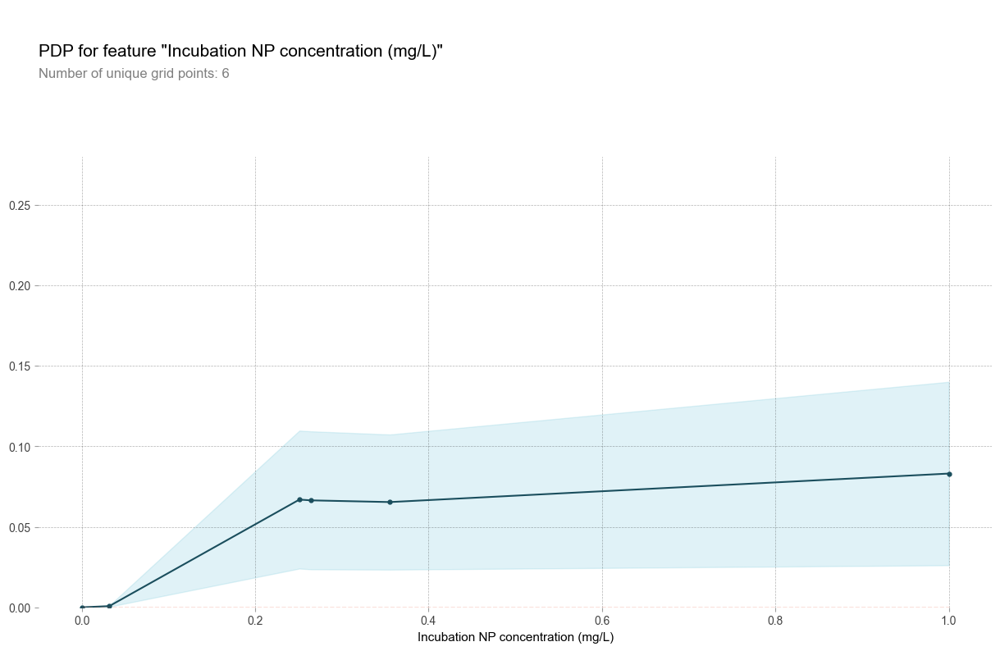

In [119]:
pdp.pdp_plot(pdpios_np_type, "Incubation NP concentration (mg/L)")
plt.show()

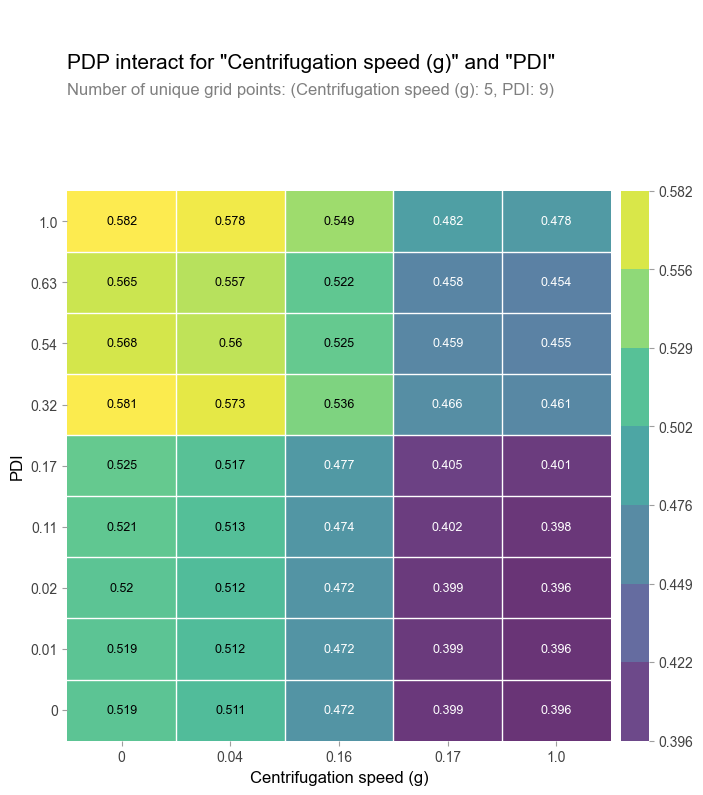

In [122]:
feature1 = "Centrifugation speed (g)"
feature2 = "PDI"
inter1 = pdp.pdp_interact(model,Train_X,model_features=colums_name.to_list(),features=[feature1,feature2])
fig,axes = pdp.pdp_interact_plot(pdp_interact_out=inter1,feature_names=[feature1,feature2],plot_type="grid")

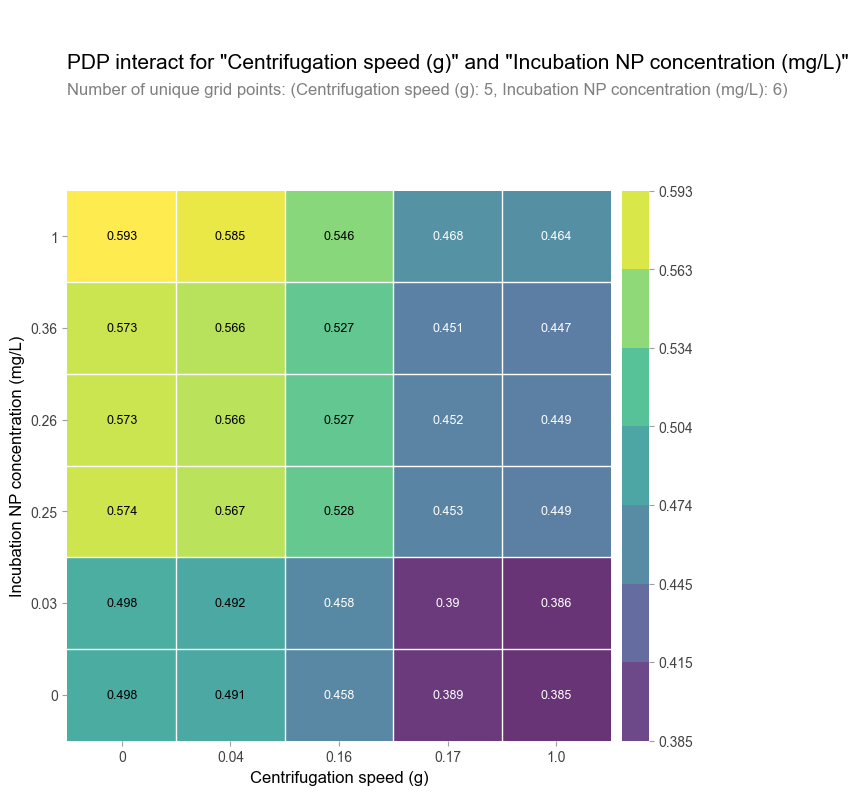

In [123]:
feature1 = "Centrifugation speed (g)"
feature2 = "Incubation NP concentration (mg/L)"
inter1 = pdp.pdp_interact(model,Train_X,model_features=colums_name.to_list(),features=[feature1,feature2])
fig,axes = pdp.pdp_interact_plot(pdp_interact_out=inter1,feature_names=[feature1,feature2],plot_type="grid")

In [152]:
explainer_P22891 = shap.TreeExplainer(model)
EX_P22891 = explainer_P22891(Train_X,Train_y)

In [122]:
EX_P22891.values.shape

(144, 129)

In [123]:
EX_P22891.feature_names = colums_name.to_list()

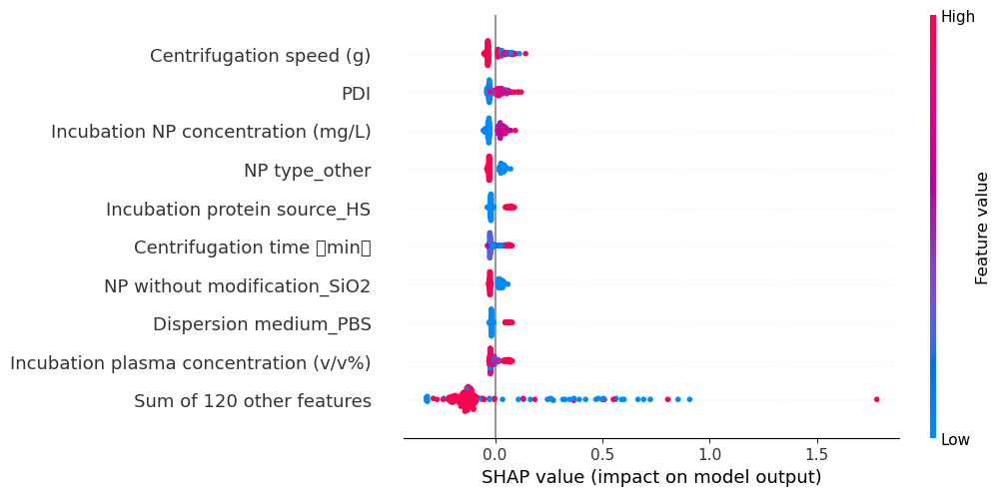

In [124]:
shap.plots.beeswarm(EX_P22891)

In [125]:
EX_P22891.values = np.concatenate([EX_P22891.values[:,:13],np.sum(EX_P22891.values[:,13:53],axis=1).reshape(144,1),np.sum(EX_P22891.values[:,53:103],axis=1).reshape(144,1),np.sum(EX_P22891.values[:,103:108],axis=1).reshape(144,1),np.sum(EX_P22891.values[:,108:112],axis=1).reshape(144,1),np.sum(EX_P22891.values[:,112:118],axis=1).reshape(144,1),np.sum(EX_P22891.values[:,118:123],axis=1).reshape(144,1),np.sum(EX_P22891.values[:,123:126],axis=1).reshape(144,1),np.sum(EX_P22891.values[:,126:],axis=1).reshape(144,1)],axis = 1)

In [126]:
EX_P22891.data = np.concatenate([EX_P22891.data[:,:13],np.sum(EX_P22891.data[:,13:53],axis=1).reshape(144,1),np.sum(EX_P22891.data[:,53:103],axis=1).reshape(144,1),np.sum(EX_P22891.data[:,103:108],axis=1).reshape(144,1),np.sum(EX_P22891.data[:,108:112],axis=1).reshape(144,1),np.sum(EX_P22891.data[:,112:118],axis=1).reshape(144,1),np.sum(EX_P22891.data[:,118:123],axis=1).reshape(144,1),np.sum(EX_P22891.data[:,123:126],axis=1).reshape(144,1),np.sum(EX_P22891.data[:,126:],axis=1).reshape(144,1)],axis = 1)

In [153]:
EX_P22891.feature_names = col_name_without_oh.to_list()

In [154]:
shap.force_plot(explainer_P22891.expected_value,EX_P22891.values,EX_P22891.data,EX_P22891.feature_names)

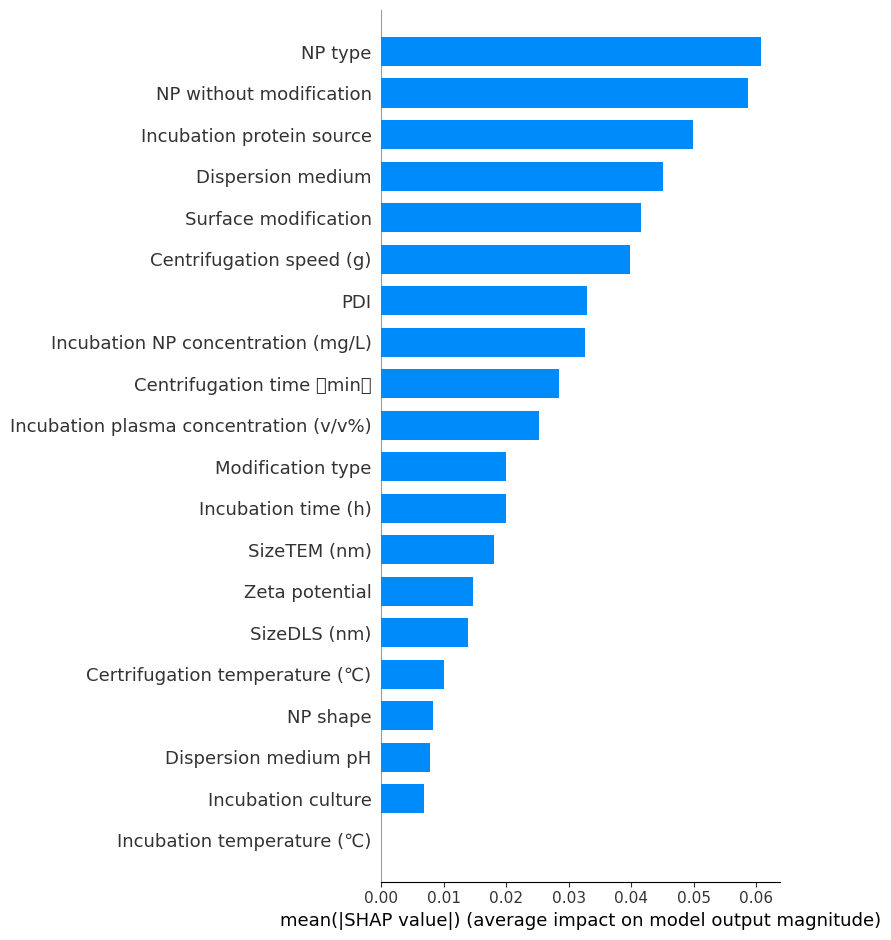

In [129]:
shap.summary_plot(EX_P22891,plot_type="bar")

In [131]:
train_data = pd.read_csv("./Protein_data/P01859_Regressor_Train_data.csv",index_col=0)
test_data = pd.read_csv("./Protein_data/P01859_Regressor_Test_data.csv",index_col=0)
del train_data["Title"]
del test_data["Title"]
Train_X = train_data.iloc[:,:-1]
Train_y = train_data.iloc[:,-1]
Test_X = test_data.iloc[:,:-1]
Test_y = test_data.iloc[:,-1]
Train_y.index = [i for i in range(len(Train_y))]
Test_y.index = [i for i in range(len(Test_y))]
Train_y = pd.DataFrame(Train_y)
Test_y = pd.DataFrame(Test_y)
scaler = MinMaxScaler()
scaler.fit(Train_X)
Train_X = scaler.transform(Train_X)
Train_X = pd.DataFrame(Train_X)
Test_X = scaler.transform(Test_X)
Test_X = pd.DataFrame(Test_X)

In [132]:
model = joblib.load("./GBDT_Regressor_Model/P01859_GBDT_best.pkl")

In [133]:
model.loss_ = model._loss

In [134]:
Test_X.columns = colums_name.to_list()
Train_X.columns = colums_name.to_list()

In [135]:
pdpios_zp = pdp.pdp_isolate(model,Train_X,model_features=Train_X.columns.to_list(),feature="Zeta potential")

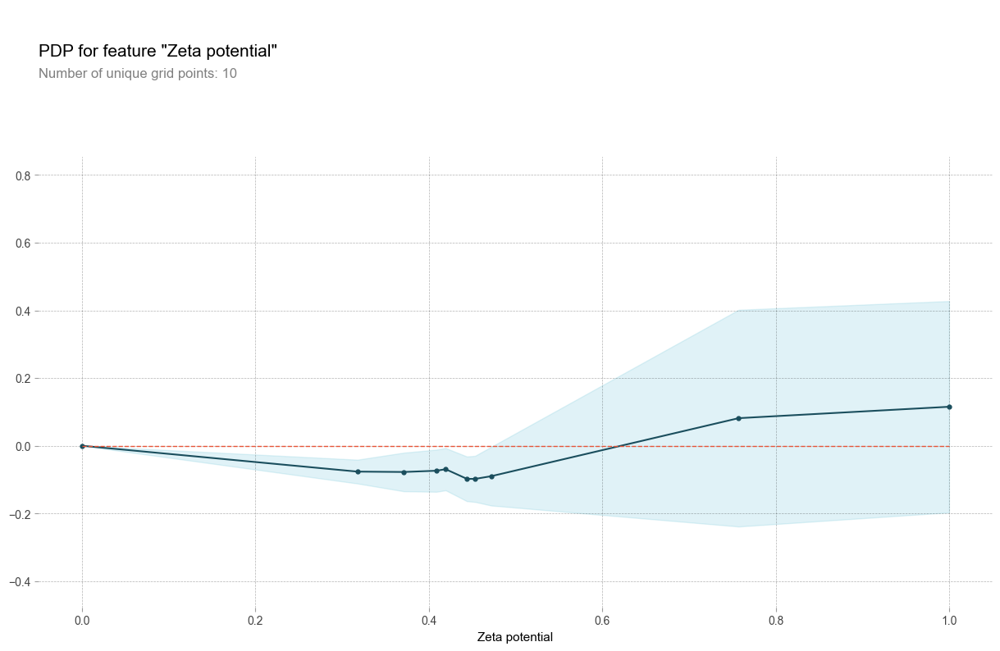

In [136]:
pdp.pdp_plot(pdpios_zp, "Zeta potential")
plt.show()

In [138]:
pdpios_It = pdp.pdp_isolate(model,Train_X,model_features=Train_X.columns.to_list(),feature="Incubation time (h)")

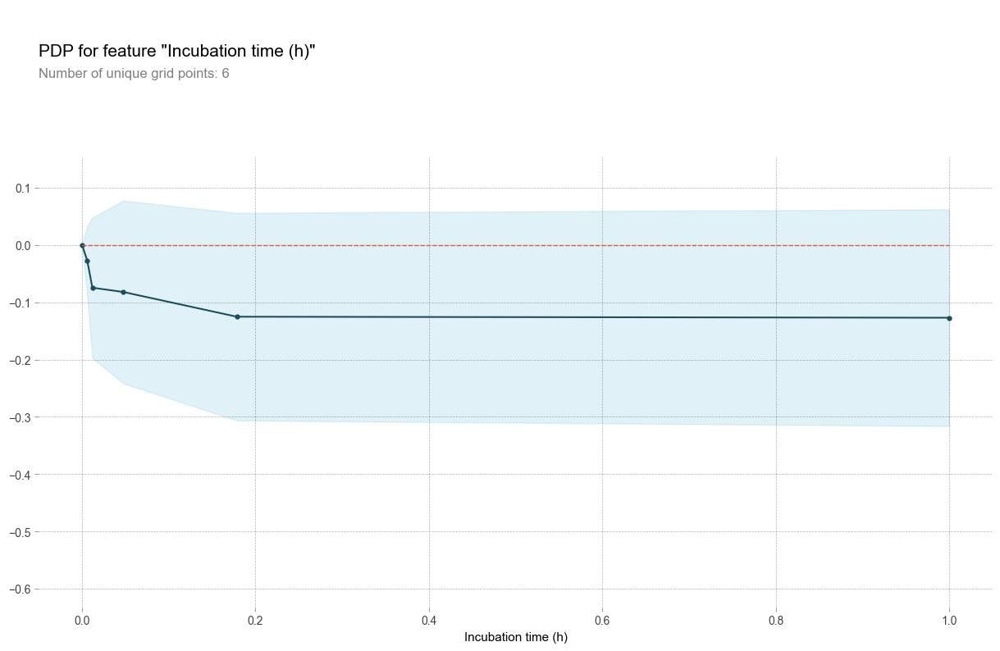

In [139]:
pdp.pdp_plot(pdpios_It, "Incubation time (h)")
plt.show()

In [140]:
pdpios_ct = pdp.pdp_isolate(model,Train_X,model_features=Train_X.columns.to_list(),feature="Certrifugation temperature (℃)")

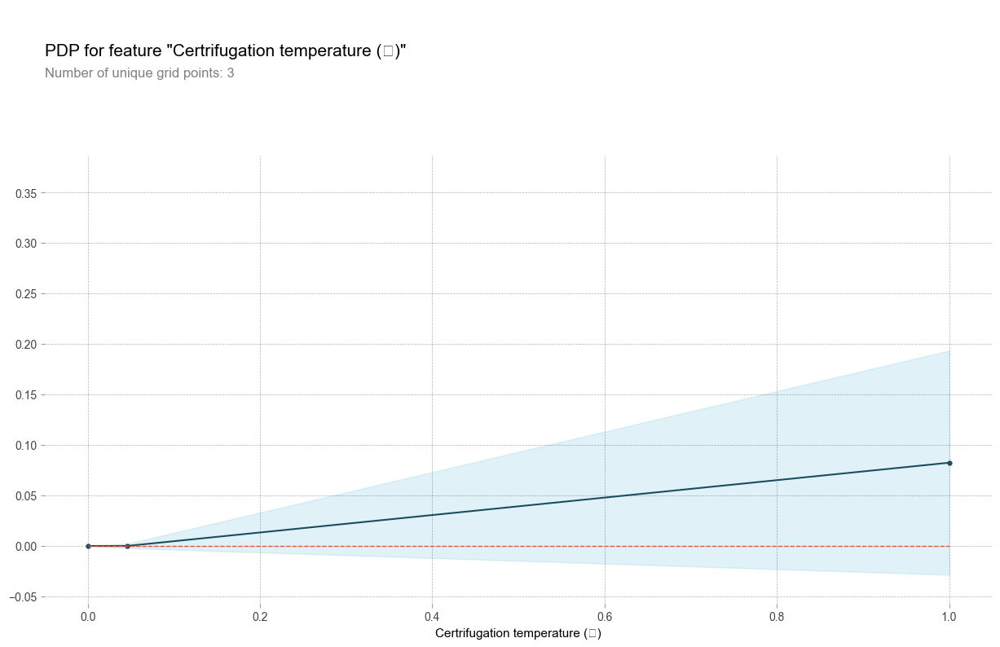

In [142]:
pdp.pdp_plot(pdpios_ct, "Certrifugation temperature (℃)")
plt.show()

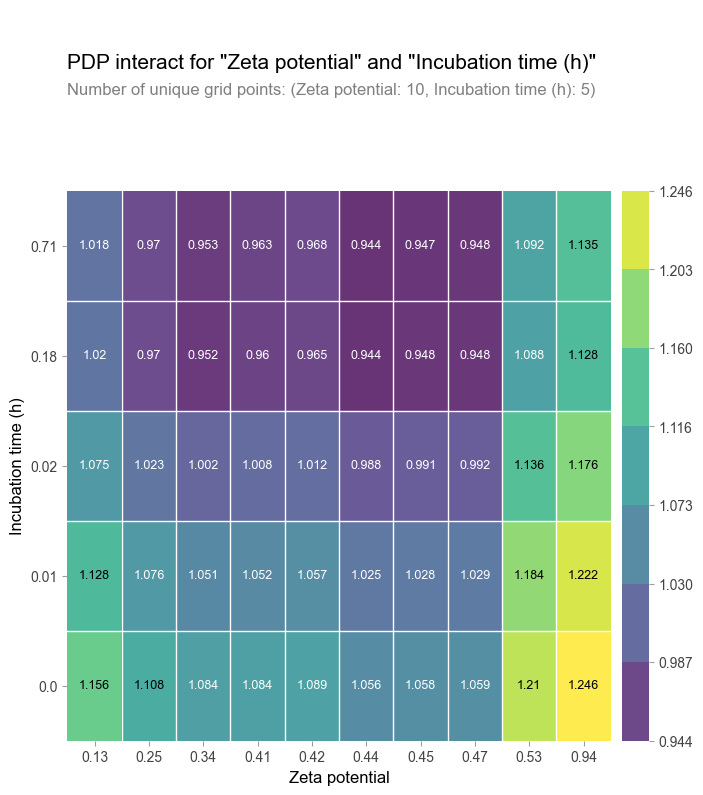

In [50]:
feature1 = "Zeta potential"
feature2 = "Incubation time (h)"
inter1 = pdp.pdp_interact(model,Test_X,model_features=colums_name.to_list(),features=[feature1,feature2])
fig,axes = pdp.pdp_interact_plot(pdp_interact_out=inter1,feature_names=[feature1,feature2],plot_type="grid")

In [73]:
colums_name

Index(['SizeTEM (nm)', 'Zeta potential',
       'Incubation plasma concentration (v/v%)',
       'Incubation NP concentration (mg/L)', 'Centrifugation speed (g)',
       'Centrifugation time （min）', 'Certrifugation temperature (℃)',
       'Dispersion medium pH', 'SizeDLS (nm)', 'PDI',
       ...
       'Dispersion medium_buffer', 'Dispersion medium_cell culture',
       'Dispersion medium_plasma', 'Dispersion medium_water',
       'Incubation culture_DMEM', 'Incubation culture_buffer',
       'Incubation culture_water', 'Modification type_Anionic',
       'Modification type_Cationic', 'Modification type_Neutral'],
      dtype='object', length=129)

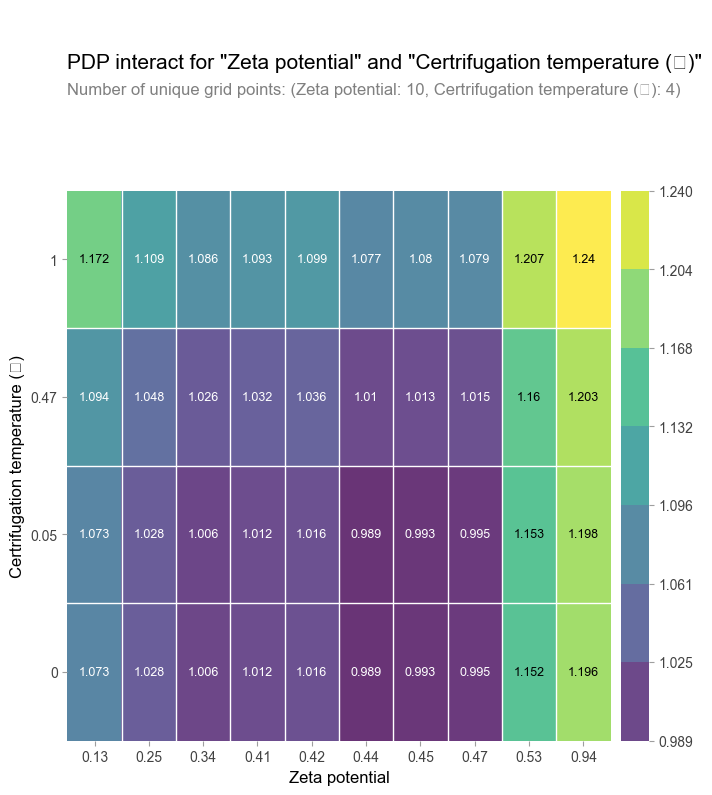

In [76]:
feature1 = "Zeta potential"
feature2 = colums_name[6]
inter1 = pdp.pdp_interact(model,Test_X,model_features=colums_name.to_list(),features=[feature1,feature2])
fig,axes = pdp.pdp_interact_plot(pdp_interact_out=inter1,feature_names=[feature1,feature2],plot_type="grid")

In [157]:
explainer_P01859 = shap.TreeExplainer(model)
EX_P01859 = explainer_P01859(Train_X,Train_y)

In [158]:
EX_P01859.values.shape

(323, 129)

In [159]:
EX_P01859.feature_names = colums_name.to_list()

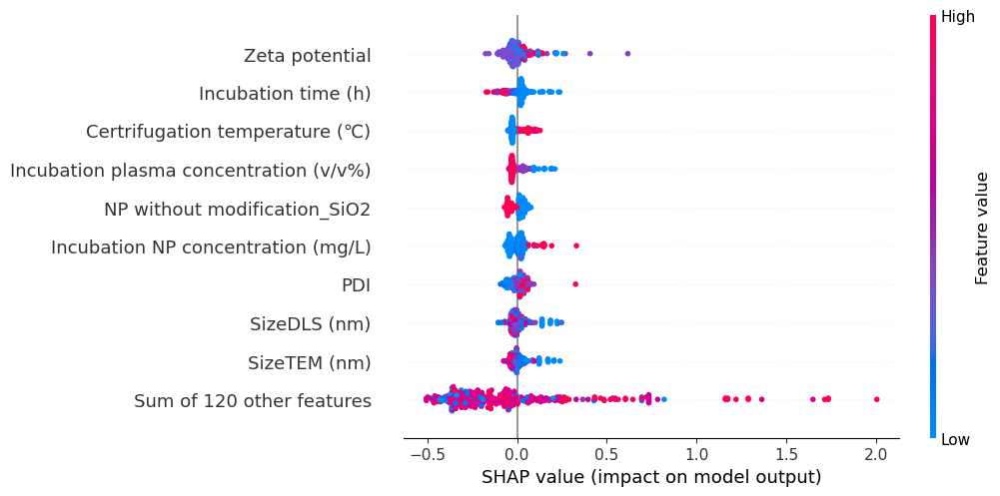

In [136]:
shap.plots.beeswarm(EX_P01859)

In [137]:
EX_P01859.values = np.concatenate([EX_P01859.values[:,:13],np.sum(EX_P01859.values[:,13:53],axis=1).reshape(323,1),np.sum(EX_P01859.values[:,53:103],axis=1).reshape(323,1),np.sum(EX_P01859.values[:,103:108],axis=1).reshape(323,1),np.sum(EX_P01859.values[:,108:112],axis=1).reshape(323,1),np.sum(EX_P01859.values[:,112:118],axis=1).reshape(323,1),np.sum(EX_P01859.values[:,118:123],axis=1).reshape(323,1),np.sum(EX_P01859.values[:,123:126],axis=1).reshape(323,1),np.sum(EX_P01859.values[:,126:],axis=1).reshape(323,1)],axis = 1)

In [138]:
EX_P01859.data = np.concatenate([EX_P01859.data[:,:13],np.sum(EX_P01859.data[:,13:53],axis=1).reshape(323,1),np.sum(EX_P01859.data[:,53:103],axis=1).reshape(323,1),np.sum(EX_P01859.data[:,103:108],axis=1).reshape(323,1),np.sum(EX_P01859.data[:,108:112],axis=1).reshape(323,1),np.sum(EX_P01859.data[:,112:118],axis=1).reshape(323,1),np.sum(EX_P01859.data[:,118:123],axis=1).reshape(323,1),np.sum(EX_P01859.data[:,123:126],axis=1).reshape(323,1),np.sum(EX_P01859.data[:,126:],axis=1).reshape(323,1)],axis = 1)

In [139]:
EX_P01859.feature_names = col_name_without_oh.to_list()

In [160]:
shap.force_plot(explainer_P01859.expected_value,EX_P01859.values,EX_P01859.data,EX_P01859.feature_names)

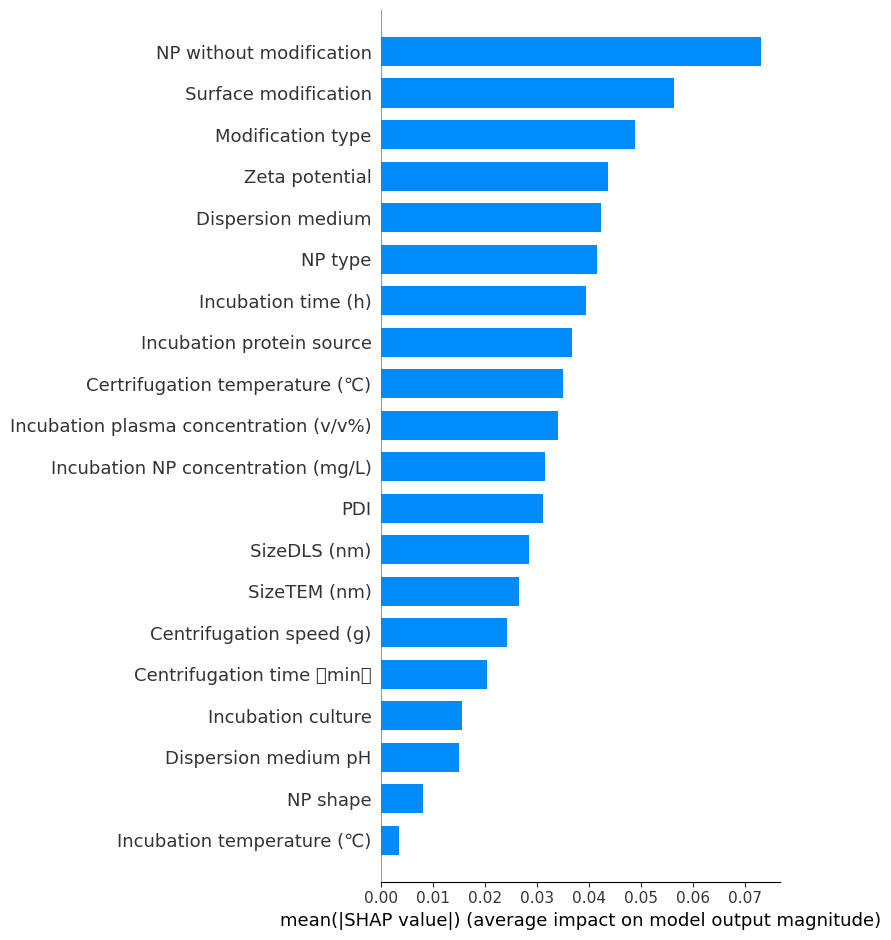

In [142]:
shap.summary_plot(EX_P01859,plot_type="bar")